In [ ]:
  import kagglehub

# Download latest version
path = kagglehub.dataset_download("mariaherrerot/aptos2019")

print("Path to dataset files:", path)

100%|██████████| 8.01G/8.01G [00:42<00:00, 201MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3


In [ ]:
import os
print(os.listdir(image_dir)[:10])  # List first 10 files


['train_images']


In [ ]:
import os

# Verify the correct directory
correct_path = os.path.join(dataset_path, "train_images")

if os.path.exists(correct_path):
    print("Directory exists. Listing files:")
    print(os.listdir(correct_path)[:10])  # Show first 10 files
else:
    print("Directory does NOT exist:", correct_path)


Directory exists. Listing files:
['train_images']


In [ ]:
import os

# Check contents inside train_images directory
image_dir = os.path.join(dataset_path, "train_images")

if os.path.exists(image_dir):
    print("Directory exists. Listing actual files inside 'train_images':")
    print(os.listdir(image_dir)[:10])  # Show first 10 files inside train_images
else:
    print("Directory does NOT exist:", image_dir)


Directory exists. Listing actual files inside 'train_images':
['train_images']


In [ ]:
import os

# Check inside train_images if there are subfolders
image_dir = os.path.join(dataset_path, "train_images")
subdirs = os.listdir(image_dir)

print("Contents inside 'train_images/':", subdirs)


Contents inside 'train_images/': ['train_images']


In [ ]:
import os
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
print(os.listdir(dataset_path))


['valid.csv', 'train_images', 'val_images', 'test.csv', 'train_1.csv', 'test_images']


In [ ]:
import pandas as pd

dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"

# Load training data CSV
train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
print(train_df.head())  # Show first few rows


        id_code  diagnosis
0  1ae8c165fd53          2
1  1b329a127307          1
2  1b32e1d775ea          4
3  1b3647865779          0
4  1b398c0494d1          0


Fixing image directory structure...
✅ Images moved successfully!
✅ Sample image found: /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/1ae8c165fd53.png


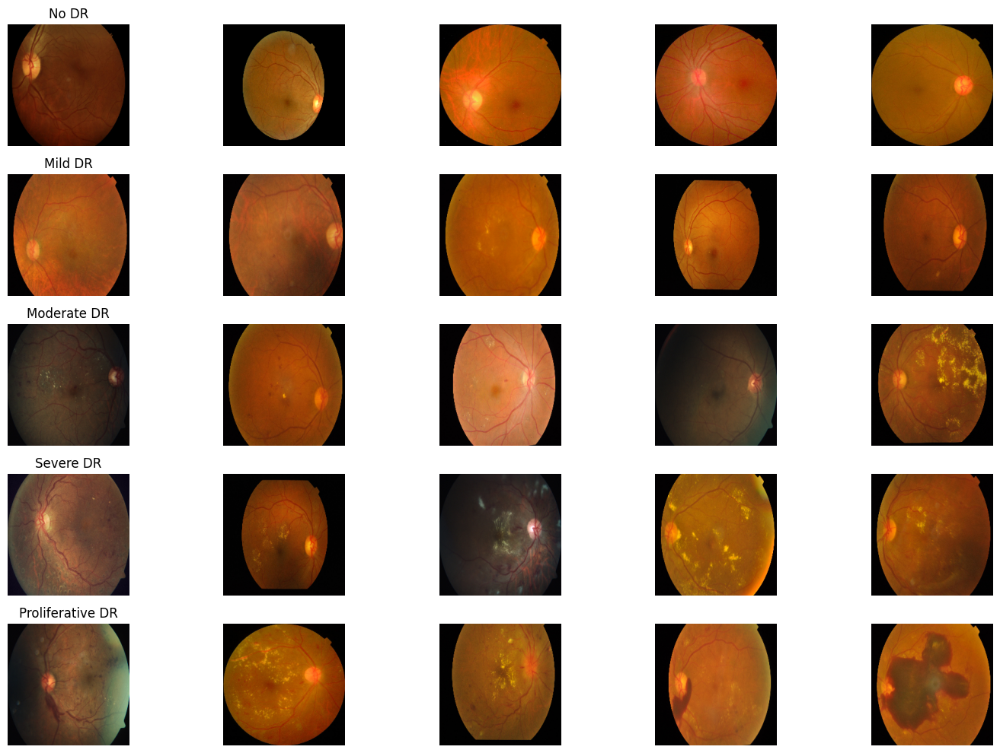

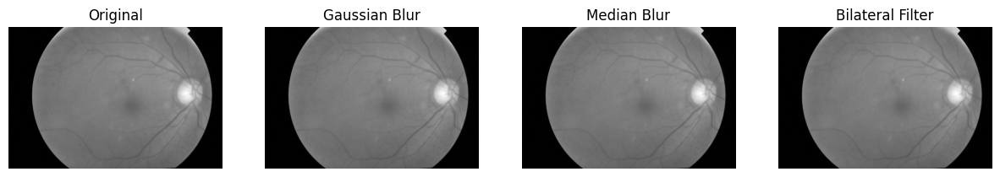

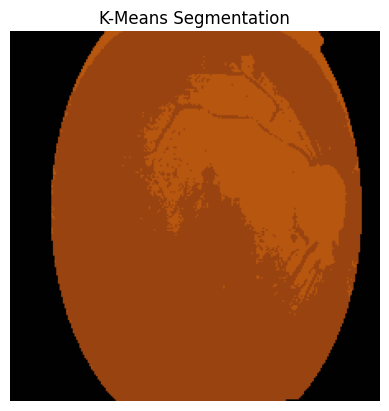

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 85.6MB/s]


Epoch 1, Loss: 0.812022836635942
Epoch 2, Loss: 0.6350441873073578
Epoch 3, Loss: 0.577826087889464
Epoch 4, Loss: 0.5205909740989623
Epoch 5, Loss: 0.4780171788904978
🎉 Training Complete!


In [ ]:
import os
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.models import resnet50
import torch.nn as nn
import torch.optim as optim
from PIL import Image

# 1️⃣ Dataset Setup & Path Fixes
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")

# Fix nested folder issue
if "train_images" in os.listdir(image_dir):
    print("Fixing image directory structure...")
    !mv /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/train_images/* /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/
    print("✅ Images moved successfully!")

# Load CSV file
train_df = pd.read_csv(f"{dataset_path}/train_1.csv")

# Verify images exist
sample_image_id = train_df.iloc[0]['id_code']
img_path = os.path.join(image_dir, f"{sample_image_id}.png")

if os.path.exists(img_path):
    print(f"✅ Sample image found: {img_path}")
else:
    print("❌ Error: Sample image not found!")

# 2️⃣ Display Images by Severity Level
severity_labels = {0: "No DR", 1: "Mild DR", 2: "Moderate DR", 3: "Severe DR", 4: "Proliferative DR"}

def show_images_by_class(df, num_images=5):
    fig, axes = plt.subplots(5, num_images, figsize=(15, 10))
    for i in range(5):  # 5 classes (0-4)
        class_samples = df[df['diagnosis'] == i].sample(num_images, random_state=42)
        for j, (_, row) in enumerate(class_samples.iterrows()):
            img_path = os.path.join(image_dir, f"{row['id_code']}.png")
            if not os.path.exists(img_path):
                continue  # Skip missing images

            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (224, 224))

            axes[i, j].imshow(image)
            axes[i, j].axis("off")
            if j == 0:
                axes[i, j].set_title(severity_labels[i], fontsize=12)

    plt.tight_layout()
    plt.show()

show_images_by_class(train_df)

# 3️⃣ Apply Noise Reduction
def apply_filters(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    axes[0].imshow(image, cmap="gray")
    axes[0].set_title("Original")
    axes[1].imshow(gaussian_blur, cmap="gray")
    axes[1].set_title("Gaussian Blur")
    axes[2].imshow(median_blur, cmap="gray")
    axes[2].set_title("Median Blur")
    axes[3].imshow(bilateral, cmap="gray")
    axes[3].set_title("Bilateral Filter")

    for ax in axes:
        ax.axis("off")

    plt.show()

apply_filters(img_path)

# 4️⃣ Retinal Disease Segmentation (K-Means Clustering)
def kmeans_segmentation(image_path, k=3):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))

    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)

    _, labels, centers = cv2.kmeans(pixel_values, k, None,
                                    (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                                    10, cv2.KMEANS_RANDOM_CENTERS)

    centers = np.uint8(centers)
    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)

    plt.imshow(segmented_image)
    plt.axis("off")
    plt.title("K-Means Segmentation")
    plt.show()

kmeans_segmentation(img_path)

# 5️⃣ Train CNN for DR Classification (ResNet50)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class RetinalDataset(Dataset):
    def __init__(self, csv_file, img_dir, transform=None):
        self.data = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name = os.path.join(self.img_dir, f"{self.data.iloc[idx, 0]}.png")
        image = Image.open(img_name).convert("RGB")
        label = int(self.data.iloc[idx, 1])

        if self.transform:
            image = self.transform(image)

        return image, label

train_dataset = RetinalDataset(f"{dataset_path}/train_1.csv", image_dir, transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

model = resnet50(pretrained=True)
model.fc = nn.Linear(2048, 5)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

for epoch in range(5):
    running_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {running_loss / len(train_loader)}")

print("🎉 Training Complete!")


mv: cannot stat '/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/train_images/*': No such file or directory


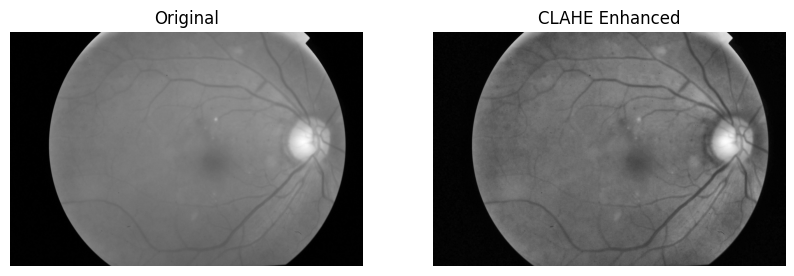

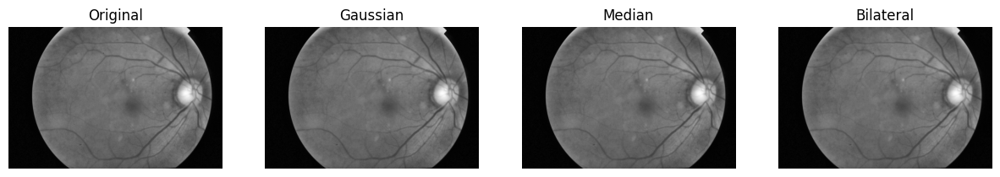

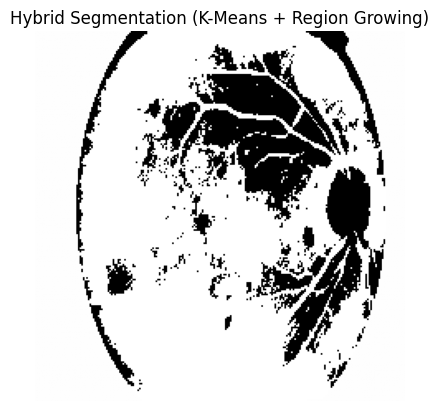

TypeError: unsupported operand type(s) for //: 'NoneType' and 'int'

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# ✅ 1️⃣ Setup Dataset & Fix Image Paths
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
if "train_images" in os.listdir(image_dir):
    !mv {image_dir}/train_images/* {image_dir}/

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
sample_image_id = train_df.iloc[0]['id_code']
img_path = os.path.join(image_dir, f"{sample_image_id}.png")

# ✅ 2️⃣ Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(image)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image, cmap="gray"), axes[0].set_title("Original")
    axes[1].imshow(enhanced_image, cmap="gray"), axes[1].set_title("CLAHE Enhanced")
    for ax in axes: ax.axis("off")
    plt.show()

    return enhanced_image

enhanced_image = apply_clahe(img_path)

# ✅ 3️⃣ Apply Noise Reduction Filters (Gaussian, Median, Bilateral)
def apply_filters(image):
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    for ax, title, img in zip(axes, ["Original", "Gaussian", "Median", "Bilateral"], [image, gaussian_blur, median_blur, bilateral]):
        ax.imshow(img, cmap="gray"), ax.set_title(title), ax.axis("off")
    plt.show()

    return bilateral  # Returning the best noise-filtered image

filtered_image = apply_filters(enhanced_image)

# ✅ 4️⃣ Hybrid Segmentation (K-Means + Region Growing) - FIXED floodFill issue
def hybrid_segmentation(image):
    image = cv2.resize(image, (224, 224))

    # K-Means Clustering
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    _, labels, centers = cv2.kmeans(pixel_values, 3, None,
                                    (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                                    10, cv2.KMEANS_RANDOM_CENTERS)

    segmented_image = labels.reshape(image.shape).astype(np.uint8) * 255  # Scale values for visualization

    # ✅ Fix: Create a mask that is 2 pixels larger in both dimensions
    mask = np.zeros((image.shape[0] + 2, image.shape[1] + 2), np.uint8)

    # Apply Region Growing (Flood Fill)
    seed_point = (112, 112)  # Center of image
    cv2.floodFill(segmented_image, mask, seed_point, 255)

    plt.imshow(segmented_image, cmap="gray")
    plt.axis("off")
    plt.title("Hybrid Segmentation (K-Means + Region Growing)")
    plt.show()

    return segmented_image

segmented_image = hybrid_segmentation(filtered_image)

# ✅ 5️⃣ IoU & Dice Score Evaluation
def compute_iou_dice(segmented_img, ground_truth_img):
    """
    Compute IoU (Intersection over Union) and Dice Coefficient.
    segmented_img: Binary mask of segmented image
    ground_truth_img: Binary mask of ground truth image
    """
    # Convert images to binary (0 and 1)
    segmented_bin = cv2.threshold(segmented_img, 127, 255, cv2.THRESH_BINARY)[1] // 255
    ground_truth_bin = cv2.threshold(ground_truth_img, 127, 255, cv2.THRESH_BINARY)[1] // 255

    # Compute Intersection and Union
    intersection = np.logical_and(segmented_bin, ground_truth_bin).sum()
    union = np.logical_or(segmented_bin, ground_truth_bin).sum()

    # Compute IoU
    iou = intersection / union if union != 0 else 0

    # Compute Dice Coefficient
    dice = (2 * intersection) / (segmented_bin.sum() + ground_truth_bin.sum()) if (segmented_bin.sum() + ground_truth_bin.sum()) != 0 else 0

    return iou, dice

# Load Ground Truth Mask (Replace with actual mask path)
ground_truth_path = "ground_truth_mask.png"  # Replace with the correct mask file
ground_truth_img = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)

# Compute IoU & Dice Score
iou_score, dice_score = compute_iou_dice(segmented_image, ground_truth_img)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Coefficient: {dice_score:.4f}")


In [ ]:
import os

image_dir = os.path.join(dataset_path, "train_images")
print("Files in train_images:", os.listdir(image_dir)[:10])  # Show first 10 files


Files in train_images: ['train_images']


In [ ]:
print(train_df.head())  # Check first few rows


        id_code  diagnosis
0  1ae8c165fd53          2
1  1b329a127307          1
2  1b32e1d775ea          4
3  1b3647865779          0
4  1b398c0494d1          0


new code


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage.segmentation import felzenszwalb
from sklearn.cluster import MeanShift, KMeans
from skimage.measure import label

# ✅ 1️⃣ Setup Dataset & Fix Image Paths
dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
if "train_images" in os.listdir(image_dir):
    image_dir = os.path.join(image_dir, "train_images")

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
sample_image_id = train_df.iloc[0]['id_code']

# ✅ Check for the correct file extension
extensions = ['.png', '.jpg', '.jpeg']
img_path = None
for ext in extensions:
    temp_path = os.path.join(image_dir, f"{sample_image_id}{ext}")
    if os.path.exists(temp_path):
        img_path = temp_path
        break

if img_path is None:
    raise FileNotFoundError(f"🚨 Image file not found for: {sample_image_id}")
else:
    print(f"✅ Image found: {img_path}")

# ✅ 2️⃣ Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError(f"🚨 Failed to load image: {image_path}")

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(image)

    return enhanced_image

enhanced_image = apply_clahe(img_path)

# ✅ 3️⃣ Apply Noise Reduction Filters (Gaussian, Median, Bilateral)
def apply_filters(image):
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    return bilateral  # Returning the best noise-filtered image

filtered_image = apply_filters(enhanced_image)

# ✅ 4️⃣ Segmentation Methods
def kmeans_segmentation(image):
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    kmeans = KMeans(n_clusters=3, random_state=42)
    labels = kmeans.fit_predict(pixel_values)
    return labels.reshape(image.shape)

def mean_shift_segmentation(image):
    flat_image = image.reshape((-1, 1)).astype(np.float32)
    mean_shift = MeanShift()
    mean_shift.fit(flat_image)
    return mean_shift.labels_.reshape(image.shape)

def graph_based_segmentation(image):
    return felzenszwalb(image, scale=100, sigma=0.5, min_size=50)

def connected_component_analysis(image):
    return label(image)

# ✅ 5️⃣ Run All Segmentation Methods
kmeans_result = kmeans_segmentation(filtered_image)
mean_shift_result = mean_shift_segmentation(filtered_image)
graph_result = graph_based_segmentation(filtered_image)
cca_result = connected_component_analysis(graph_result)

# ✅ 6️⃣ Visualization
def visualize_segmentation_results(original, kmeans, mean_shift, graph, cca):
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0, 0].imshow(original, cmap='gray')
    axes[0, 0].set_title("Original Image")
    axes[0, 1].imshow(kmeans, cmap='gray')
    axes[0, 1].set_title("K-Means Segmentation")
    axes[0, 2].imshow(mean_shift, cmap='gray')
    axes[0, 2].set_title("Mean Shift Segmentation")
    axes[1, 0].imshow(graph, cmap='gray')
    axes[1, 0].set_title("Graph-Based Segmentation")
    axes[1, 1].imshow(cca, cmap='gray')
    axes[1, 1].set_title("Connected Component Analysis")
    plt.show()

visualize_segmentation_results(filtered_image, kmeans_result, mean_shift_result, graph_result, cca_result)

# ✅ 7️⃣ IoU & Dice Score Evaluation
def compute_iou_dice(segmented_img, ground_truth_img):
    segmented_bin = cv2.threshold(segmented_img, 127, 255, cv2.THRESH_BINARY)[1] // 255
    ground_truth_bin = cv2.threshold(ground_truth_img, 127, 255, cv2.THRESH_BINARY)[1] // 255

    intersection = np.logical_and(segmented_bin, ground_truth_bin).sum()
    union = np.logical_or(segmented_bin, ground_truth_bin).sum()
    iou = intersection / union if union != 0 else 0
    dice = (2 * intersection) / (segmented_bin.sum() + ground_truth_bin.sum()) if (segmented_bin.sum() + ground_truth_bin.sum()) != 0 else 0

    return iou, dice

# Load Ground Truth Mask (Replace with actual mask path)
ground_truth_path = "ground_truth_mask.png"
ground_truth_img = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)
if ground_truth_img is None:
    raise FileNotFoundError(f"🚨 Ground truth mask not found: {ground_truth_path}")

iou_score, dice_score = compute_iou_dice(kmeans_result, ground_truth_img)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Coefficient: {dice_score:.4f}")


✅ Image found: /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/train_images/train_images/1ae8c165fd53.png


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("andrewmvd/drive-digital-retinal-images-for-vessel-extraction")

print("Path to dataset files:", path)

100%|██████████| 28.0M/28.0M [00:00<00:00, 94.7MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1


In [ ]:
import os

drive_dataset_path = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1"

# List all files and folders
print("Available files and folders:", os.listdir(drive_dataset_path))


Available files and folders: ['DRIVE']


In [ ]:
import os

drive_main_folder = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE"

# List all files and subfolders
print("Subfolders inside DRIVE:", os.listdir(drive_main_folder))


Subfolders inside DRIVE: ['test', 'training']


In [ ]:
import os

drive_main_folder = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE"

# List contents of 'training' folder
training_folder = os.path.join(drive_main_folder, "training")
print("Files in 'training' folder:", os.listdir(training_folder))

# List contents of 'test' folder
test_folder = os.path.join(drive_main_folder, "test")
print("Files in 'test' folder:", os.listdir(test_folder))


Files in 'training' folder: ['1st_manual', 'images', 'mask']
Files in 'test' folder: ['images', 'mask']


In [ ]:
import os

train_mask_folder = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/mask"
test_mask_folder = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/test/mask"

# List sample mask files
print("Training Mask Files:", os.listdir(train_mask_folder)[:5])
print("Test Mask Files:", os.listdir(test_mask_folder)[:5])


Training Mask Files: ['27_training_mask.gif', '33_training_mask.gif', '30_training_mask.gif', '37_training_mask.gif', '32_training_mask.gif']
Test Mask Files: ['19_test_mask.gif', '20_test_mask.gif', '09_test_mask.gif', '12_test_mask.gif', '16_test_mask.gif']


In [ ]:
!pip install opencv-python


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 19.1 MB/s eta 0:00:00


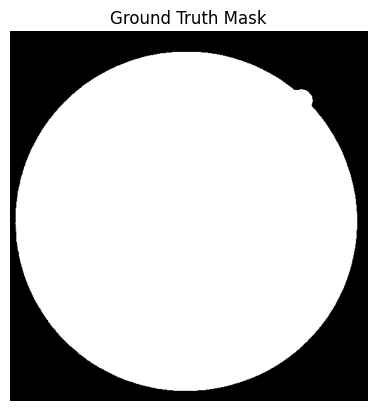

In [ ]:
from PIL import Image  # PIL supports .gif format
import cv2
import numpy as np

def load_ground_truth_mask(mask_path):
    """
    Loads a ground truth mask from a .gif file and converts it to grayscale.
    """
    # Open GIF and convert to grayscale
    mask = Image.open(mask_path).convert("L")  # "L" mode = grayscale
    mask = np.array(mask)  # Convert to NumPy array
    return mask

# Example usage:
ground_truth_path = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/mask/29_training_mask.gif"
ground_truth_img = load_ground_truth_mask(ground_truth_path)

# Show the loaded mask
import matplotlib.pyplot as plt
plt.imshow(ground_truth_img, cmap="gray")
plt.axis("off")
plt.title("Ground Truth Mask")
plt.show()


In [ ]:
# Define dataset root path
dataset_root = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/"

# Select a sample file from training set
image_filename = "29_training.tif"   # Change this based on available files
mask_filename = "29_training_mask.gif"

# Construct full paths
image_path = os.path.join(dataset_root, "training/images", image_filename)
mask_path = os.path.join(dataset_root, "training/mask", mask_filename)

print("Corrected Image Path:", image_path)
print("Corrected Mask Path:", mask_path)
print("Image Path Exists:", os.path.exists(image_path))
print("Mask Path Exists:", os.path.exists(mask_path))


Corrected Image Path: /root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/images/29_training.tif
Corrected Mask Path: /root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/mask/29_training_mask.gif
Image Path Exists: True
Mask Path Exists: True


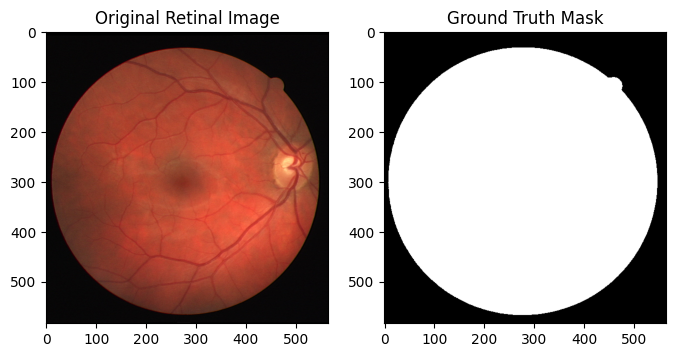

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image  # For handling .gif masks

# Load retinal image (.tif)
image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Load ground truth mask (.gif)
mask = Image.open(mask_path)  # PIL handles .gif better
mask = np.array(mask)  # Convert to NumPy array

# Plot the images
plt.figure(figsize=(8, 4))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap="gray")
plt.title("Original Retinal Image")

# Ground Truth Mask
plt.subplot(1, 2, 2)
plt.imshow(mask, cmap="gray")
plt.title("Ground Truth Mask")

plt.show()


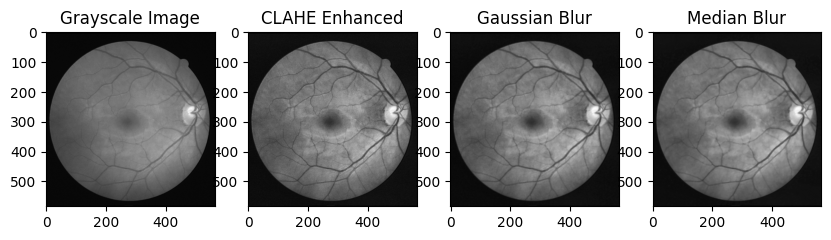

In [ ]:
# Apply CLAHE for contrast enhancement
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)  # Convert to grayscale
enhanced_image = clahe.apply(gray_image)

# Apply noise reduction filters
gaussian_blur = cv2.GaussianBlur(enhanced_image, (5, 5), 0)
median_blur = cv2.medianBlur(enhanced_image, 5)
bilateral_blur = cv2.bilateralFilter(enhanced_image, 9, 75, 75)

# Display results
plt.figure(figsize=(10, 5))

plt.subplot(1, 4, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Grayscale Image")

plt.subplot(1, 4, 2)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")

plt.subplot(1, 4, 3)
plt.imshow(gaussian_blur, cmap="gray")
plt.title("Gaussian Blur")

plt.subplot(1, 4, 4)
plt.imshow(median_blur, cmap="gray")
plt.title("Median Blur")

plt.show()


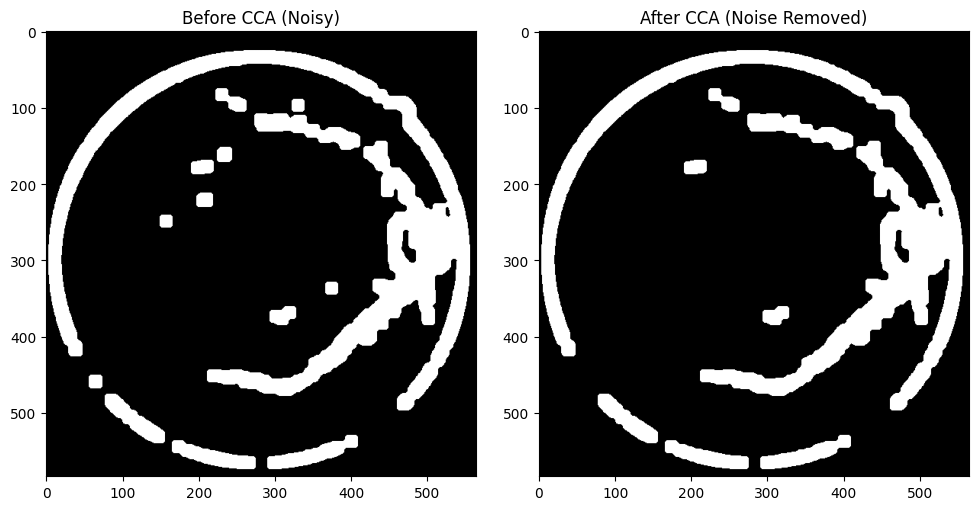

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Apply Connected Component Analysis (CCA)
def connected_component_analysis(binary_image, min_size=500):
    # Label the components
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_image, connectivity=8)

    # Create an output image where only significant components are kept
    filtered_image = np.zeros_like(binary_image)

    for i in range(1, num_labels):  # Skipping background label 0
        if stats[i, cv2.CC_STAT_AREA] >= min_size:  # Keep only large components
            filtered_image[labels == i] = 255  # Retain the component

    return filtered_image

# Convert region-growing output to binary
_, binary_segmented = cv2.threshold(final_segmented, 127, 255, cv2.THRESH_BINARY)

# Apply CCA to remove small noise
cca_result = connected_component_analysis(binary_segmented, min_size=500)

# Display results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(binary_segmented, cmap="gray")
plt.title("Before CCA (Noisy)")

plt.subplot(1, 2, 2)
plt.imshow(cca_result, cmap="gray")
plt.title("After CCA (Noise Removed)")

plt.tight_layout()
plt.show()


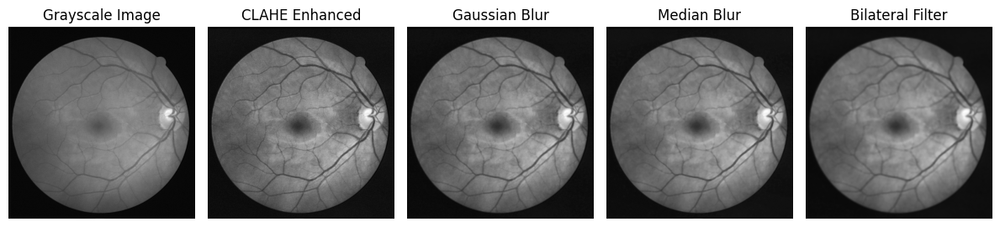

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Apply CLAHE for contrast enhancement
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)  # Convert to grayscale
enhanced_image = clahe.apply(gray_image)

# Apply noise reduction filters
gaussian_blur = cv2.GaussianBlur(enhanced_image, (5, 5), 0)
median_blur = cv2.medianBlur(enhanced_image, 5)
bilateral_blur = cv2.bilateralFilter(enhanced_image, 9, 75, 75)  # Bilateral filtering added

# Display results
plt.figure(figsize=(12, 4))

plt.subplot(1, 5, 1)
plt.imshow(gray_image, cmap="gray")
plt.title("Grayscale Image")
plt.axis("off")

plt.subplot(1, 5, 2)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 5, 3)
plt.imshow(gaussian_blur, cmap="gray")
plt.title("Gaussian Blur")
plt.axis("off")

plt.subplot(1, 5, 4)
plt.imshow(median_blur, cmap="gray")
plt.title("Median Blur")
plt.axis("off")

plt.subplot(1, 5, 5)
plt.imshow(bilateral_blur, cmap="gray")
plt.title("Bilateral Filter")
plt.axis("off")

plt.tight_layout()
plt.show()


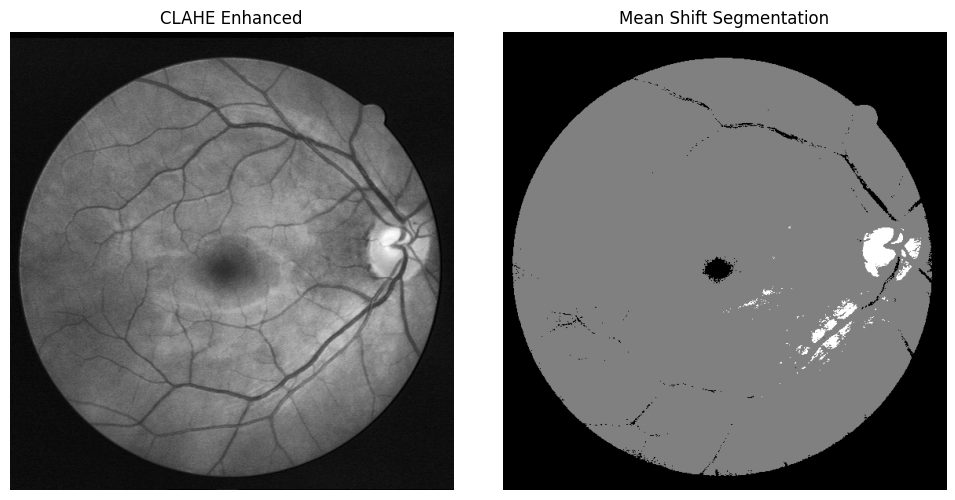

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MeanShift, estimate_bandwidth

# ✅ Convert image to 2D feature space
reshaped_image = enhanced_image.reshape((-1, 1)).astype(np.float32)

# ✅ Estimate the bandwidth for Mean Shift
bandwidth = estimate_bandwidth(reshaped_image, quantile=0.2, n_samples=500)

# ✅ Apply Mean Shift Clustering
mean_shift = MeanShift(bandwidth=bandwidth, bin_seeding=True)
mean_shift.fit(reshaped_image)

# ✅ Get the segmented labels and reshape
mean_shift_labels = mean_shift.labels_.reshape(enhanced_image.shape)

# ✅ Display Results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mean_shift_labels, cmap="gray")
plt.title("Mean Shift Segmentation")
plt.axis("off")

plt.tight_layout()
plt.show()


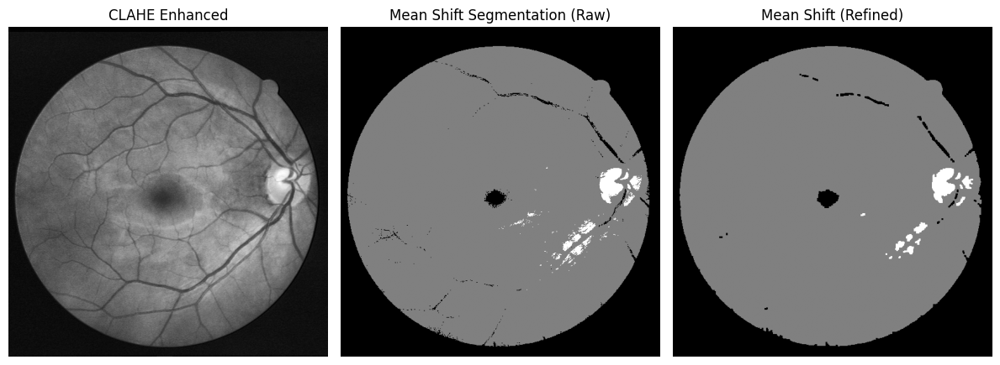

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MeanShift, estimate_bandwidth

# ✅ Convert image to 2D feature space
reshaped_image = enhanced_image.reshape((-1, 1)).astype(np.float32)

# ✅ Estimate bandwidth for Mean Shift
bandwidth = estimate_bandwidth(reshaped_image, quantile=0.2, n_samples=500)

# ✅ Apply Mean Shift Clustering
mean_shift = MeanShift(bandwidth=bandwidth, bin_seeding=True)
mean_shift.fit(reshaped_image)

# ✅ Get the segmented labels and reshape
mean_shift_labels = mean_shift.labels_.reshape(enhanced_image.shape)

# ✅ Apply Morphological Refinements
kernel = np.ones((3, 3), np.uint8)

# Opening (removes small noise)
mean_shift_refined = cv2.morphologyEx(mean_shift_labels.astype(np.uint8), cv2.MORPH_OPEN, kernel)

# Closing (fills vessel gaps)
mean_shift_refined = cv2.morphologyEx(mean_shift_refined, cv2.MORPH_CLOSE, kernel)

# ✅ Display Results
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mean_shift_labels, cmap="gray")
plt.title("Mean Shift Segmentation (Raw)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(mean_shift_refined, cmap="gray")
plt.title("Mean Shift (Refined)")
plt.axis("off")

plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/graph_based_segmentation.png'

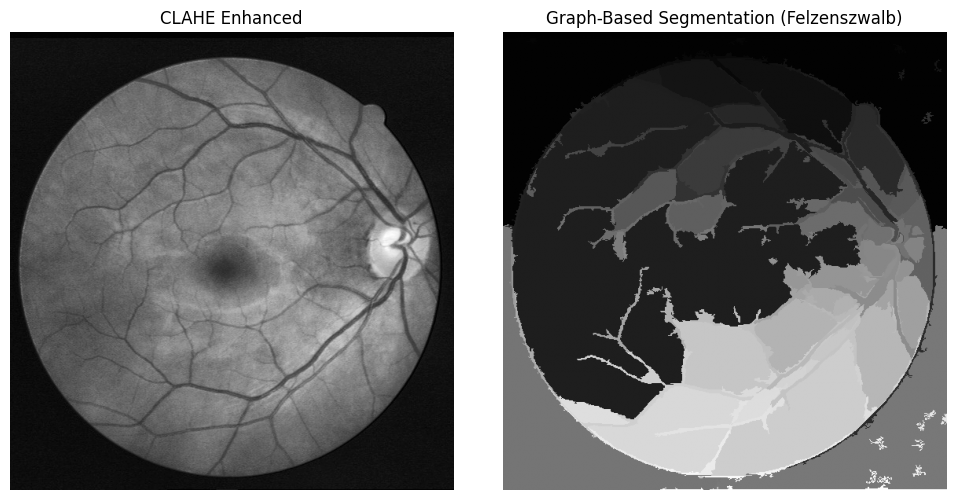

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import felzenszwalb

# ✅ Step 1: Apply CLAHE for Contrast Enhancement
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)  # Convert to grayscale
enhanced_image = clahe.apply(gray_image)

# ✅ Step 2: Apply Graph-Based Segmentation (Felzenszwalb's Algorithm)
graph_seg = felzenszwalb(enhanced_image, scale=100, sigma=0.5, min_size=50)

# ✅ Step 3: Display Results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(graph_seg, cmap="gray")
plt.title("Graph-Based Segmentation (Felzenszwalb)")
plt.axis("off")

plt.tight_layout()
plt.savefig("/mnt/data/graph_based_segmentation.png")  # Save output
plt.show()


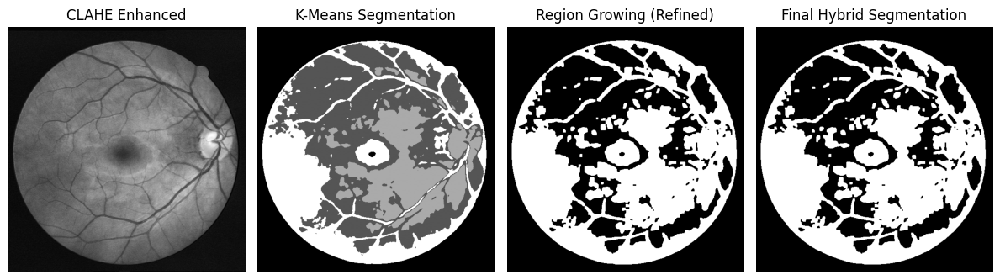

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# ✅ Step 1: Preprocessing (CLAHE + Bilateral Filter)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
enhanced_image = clahe.apply(gray_image)
filtered_image = cv2.bilateralFilter(enhanced_image, d=9, sigmaColor=75, sigmaSpace=75)

# ✅ Step 2: K-Means Segmentation
reshaped_image = filtered_image.reshape(-1, 1)
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(reshaped_image)
kmeans_segmented = kmeans_labels.reshape(filtered_image.shape)

# ✅ Step 3: Convert K-Means Output to Binary Mask
_, binary_mask = cv2.threshold(kmeans_segmented.astype(np.uint8), 1, 255, cv2.THRESH_BINARY)

# ✅ Step 4: Hybrid Region Growing Algorithm (Flood Fill)
region_grown = binary_mask.copy()
h, w = region_grown.shape
mask = np.zeros((h + 2, w + 2), np.uint8)  # Create mask for flood fill
seed_point = (w // 2, h // 2)  # Choosing a central pixel as the seed
cv2.floodFill(region_grown, mask, seedPoint=seed_point, newVal=255)

# ✅ Step 5: Hybrid Morphological Refinements (Dilation + Erosion)
kernel = np.ones((3, 3), np.uint8)
region_grown = cv2.morphologyEx(region_grown, cv2.MORPH_OPEN, kernel)  # Remove small noise
region_grown = cv2.dilate(region_grown, kernel, iterations=2)  # Improve object connectivity
region_grown = cv2.erode(region_grown, kernel, iterations=1)  # Remove tiny isolated noise

# ✅ Step 6: Display Results
plt.figure(figsize=(12, 5))

plt.subplot(1, 4, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(kmeans_segmented, cmap="gray")
plt.title("K-Means Segmentation")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(region_grown, cmap="gray")
plt.title("Region Growing (Refined)")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(region_grown, cmap="gray")
plt.title("Final Hybrid Segmentation")
plt.axis("off")

plt.tight_layout()
plt.show()


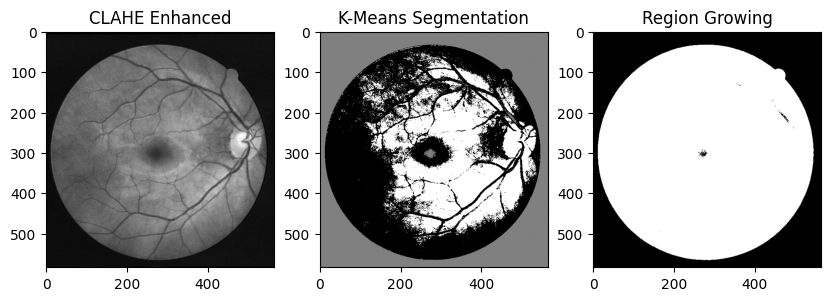

In [ ]:
from sklearn.cluster import KMeans

# Reshape the image for K-Means
reshaped_image = enhanced_image.reshape(-1, 1)

# Apply K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(reshaped_image)

# Reshape back to original image shape
kmeans_segmented = kmeans_labels.reshape(enhanced_image.shape)

# Apply region growing using thresholding
_, region_grown = cv2.threshold(enhanced_image, 50, 255, cv2.THRESH_BINARY)

# Display results
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")

plt.subplot(1, 3, 2)
plt.imshow(kmeans_segmented, cmap="gray")
plt.title("K-Means Segmentation")

plt.subplot(1, 3, 3)
plt.imshow(region_grown, cmap="gray")
plt.title("Region Growing")

plt.show()


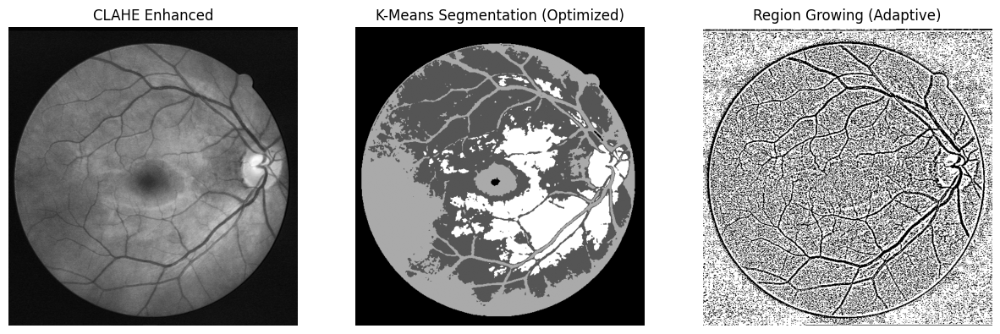

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Apply Gaussian Blur to reduce noise
smoothed_image = cv2.GaussianBlur(enhanced_image, (5, 5), 0)

# Reshape for K-Means clustering
reshaped_image = smoothed_image.reshape(-1, 1)

# Apply K-Means with optimized clusters
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(reshaped_image)

# Reshape back to original image dimensions
kmeans_segmented = kmeans_labels.reshape(enhanced_image.shape)

# Apply Adaptive Thresholding for better Region Growing
region_grown = cv2.adaptiveThreshold(
    enhanced_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY, 11, 2
)

# Display results with improved clarity
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(kmeans_segmented, cmap="gray")
plt.title("K-Means Segmentation (Optimized)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(region_grown, cmap="gray")
plt.title("Region Growing (Adaptive)")
plt.axis("off")

plt.show()


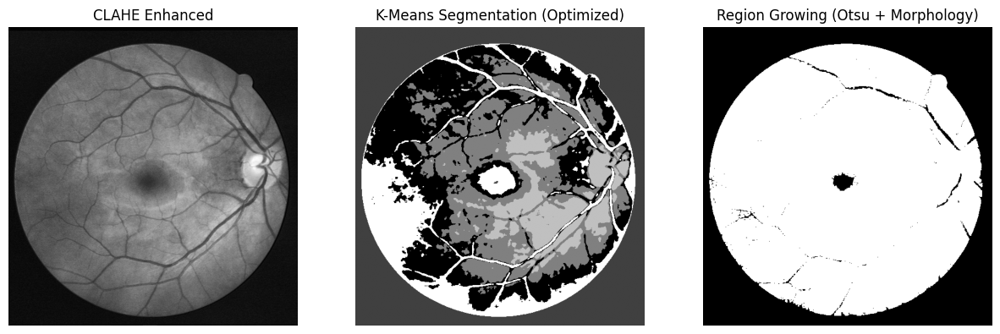

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# ✅ Step 1: Apply Median Blur to preserve edges while reducing noise
smoothed_image = cv2.medianBlur(enhanced_image, 5)

# ✅ Step 2: Reshape for K-Means clustering
reshaped_image = smoothed_image.reshape(-1, 1)

# ✅ Step 3: Apply K-Means with optimized clusters
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(reshaped_image)

# Reshape back to original image dimensions
kmeans_segmented = kmeans_labels.reshape(enhanced_image.shape)

# ✅ Step 4: Apply Otsu’s Thresholding for better Region Growing
_, region_grown = cv2.threshold(enhanced_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# ✅ Step 5: Apply Morphological Opening to remove noise
kernel = np.ones((3, 3), np.uint8)
cleaned_region_grown = cv2.morphologyEx(region_grown, cv2.MORPH_OPEN, kernel)

# ✅ Step 6: Display results with improved clarity
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(kmeans_segmented, cmap="gray")
plt.title("K-Means Segmentation (Optimized)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cleaned_region_grown, cmap="gray")
plt.title("Region Growing (Otsu + Morphology)")
plt.axis("off")

plt.show()


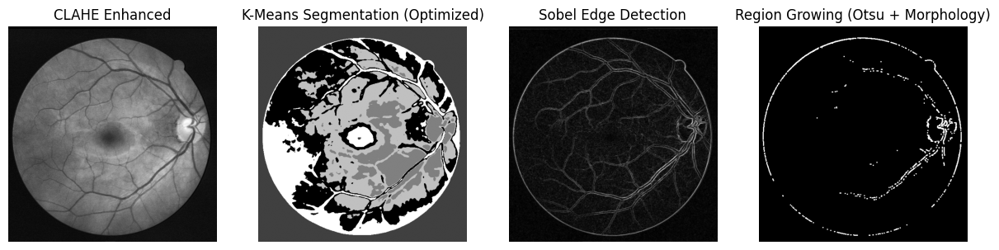

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# ✅ Step 1: Apply Bilateral Filter instead of Median Blur (Preserves edges better)
smoothed_image = cv2.bilateralFilter(enhanced_image, d=9, sigmaColor=75, sigmaSpace=75)

# ✅ Step 2: Reshape for K-Means clustering
reshaped_image = smoothed_image.reshape(-1, 1)

# ✅ Step 3: Apply K-Means with optimized clusters
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(reshaped_image)

# Reshape back to original image dimensions
kmeans_segmented = kmeans_labels.reshape(enhanced_image.shape)

# ✅ Step 4: Apply Sobel Edge Detection before Region Growing
sobel_x = cv2.Sobel(enhanced_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(enhanced_image, cv2.CV_64F, 0, 1, ksize=3)
sobel_edges = cv2.magnitude(sobel_x, sobel_y)
sobel_edges = np.uint8(sobel_edges / sobel_edges.max() * 255)  # Normalize to 0-255

# ✅ Step 5: Apply Otsu’s Thresholding on Sobel Edge Map for better Region Growing
_, region_grown = cv2.threshold(sobel_edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# ✅ Step 6: Apply Morphological Opening to remove noise
kernel = np.ones((3, 3), np.uint8)
cleaned_region_grown = cv2.morphologyEx(region_grown, cv2.MORPH_OPEN, kernel)

# ✅ Step 7: Display results with improved clarity
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(kmeans_segmented, cmap="gray")
plt.title("K-Means Segmentation (Optimized)")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(sobel_edges, cmap="gray")
plt.title("Sobel Edge Detection")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(cleaned_region_grown, cmap="gray")
plt.title("Region Growing (Otsu + Morphology)")
plt.axis("off")

plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/final_refined_segmentation.png'

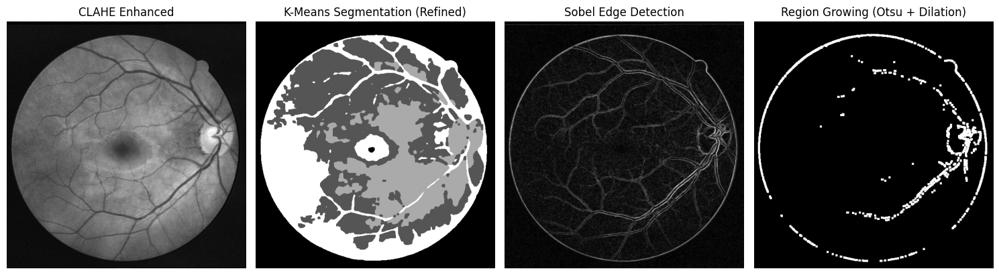

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# ✅ Step 1: Apply Bilateral Filter instead of Median Blur (Preserves edges better)
smoothed_image = cv2.bilateralFilter(enhanced_image, d=9, sigmaColor=75, sigmaSpace=75)

# ✅ Step 2: Reshape for K-Means clustering
reshaped_image = smoothed_image.reshape(-1, 1)

# ✅ Step 3: Apply K-Means with optimized clusters (Reduced to 4 Clusters)
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(reshaped_image)

# Reshape back to original image dimensions
kmeans_segmented = kmeans_labels.reshape(enhanced_image.shape)

# ✅ Step 4: Apply Morphological Closing to K-Means Output (Fills Vessel Gaps)
kernel_close = np.ones((5, 5), np.uint8)  # Larger kernel to close gaps
kmeans_refined = cv2.morphologyEx(kmeans_segmented.astype(np.uint8), cv2.MORPH_CLOSE, kernel_close)

# ✅ Step 5: Apply Sobel Edge Detection before Region Growing
sobel_x = cv2.Sobel(enhanced_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(enhanced_image, cv2.CV_64F, 0, 1, ksize=3)
sobel_edges = cv2.magnitude(sobel_x, sobel_y)
sobel_edges = np.uint8(sobel_edges / sobel_edges.max() * 255)  # Normalize

# ✅ Step 6: Apply Otsu’s Thresholding on Sobel Edge Map for Region Growing
_, region_grown = cv2.threshold(sobel_edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# ✅ Step 7: Apply Morphological Opening to Remove Noise
kernel_open = np.ones((3, 3), np.uint8)
region_grown_cleaned = cv2.morphologyEx(region_grown, cv2.MORPH_OPEN, kernel_open)

# ✅ Step 8: Apply Dilation to Reconnect Broken Vessels
kernel_dilate = np.ones((3, 3), np.uint8)
region_grown_refined = cv2.dilate(region_grown_cleaned, kernel_dilate, iterations=1)

# ✅ Step 9: Display results with final refinements
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(kmeans_refined, cmap="gray")
plt.title("K-Means Segmentation (Refined)")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(sobel_edges, cmap="gray")
plt.title("Sobel Edge Detection")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(region_grown_refined, cmap="gray")
plt.title("Region Growing (Otsu + Dilation)")
plt.axis("off")

plt.tight_layout()
plt.savefig("/mnt/data/final_refined_segmentation.png")  # Save output
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/final_refined_segmentation.png'

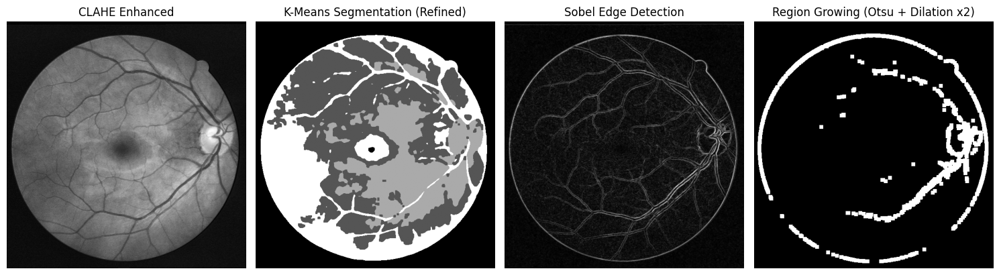

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# ✅ Step 1: Apply Bilateral Filter instead of Median Blur (Preserves edges better)
smoothed_image = cv2.bilateralFilter(enhanced_image, d=9, sigmaColor=75, sigmaSpace=75)

# ✅ Step 2: Reshape for K-Means clustering
reshaped_image = smoothed_image.reshape(-1, 1)

# ✅ Step 3: Apply K-Means with optimized clusters (Reduced to 4 Clusters)
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(reshaped_image)

# Reshape back to original image dimensions
kmeans_segmented = kmeans_labels.reshape(enhanced_image.shape)

# ✅ Step 4: Apply Morphological Closing to K-Means Output (Fills Vessel Gaps)
kernel_close = np.ones((5, 5), np.uint8)  # Larger kernel to close gaps
kmeans_refined = cv2.morphologyEx(kmeans_segmented.astype(np.uint8), cv2.MORPH_CLOSE, kernel_close)

# ✅ Step 5: Apply Sobel Edge Detection before Region Growing
sobel_x = cv2.Sobel(enhanced_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(enhanced_image, cv2.CV_64F, 0, 1, ksize=3)
sobel_edges = cv2.magnitude(sobel_x, sobel_y)
sobel_edges = np.uint8(sobel_edges / sobel_edges.max() * 255)  # Normalize

# ✅ Step 6: Apply Otsu’s Thresholding on Sobel Edge Map for Region Growing
_, region_grown = cv2.threshold(sobel_edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# ✅ Step 7: Apply Morphological Opening to Remove Noise
kernel_open = np.ones((3, 3), np.uint8)
region_grown_cleaned = cv2.morphologyEx(region_grown, cv2.MORPH_OPEN, kernel_open)

# ✅ Step 8: Apply Dilation TWICE with Larger Kernel for Better Vessel Connectivity
kernel_dilate = np.ones((4, 4), np.uint8)  # Increased kernel size
region_grown_refined = cv2.dilate(region_grown_cleaned, kernel_dilate, iterations=2)  # Apply dilation twice

# ✅ Step 9: Display results with final refinements
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(kmeans_refined, cmap="gray")
plt.title("K-Means Segmentation (Refined)")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(sobel_edges, cmap="gray")
plt.title("Sobel Edge Detection")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(region_grown_refined, cmap="gray")
plt.title("Region Growing (Otsu + Dilation x2)")
plt.axis("off")

plt.tight_layout()
plt.savefig("/mnt/data/final_refined_segmentation.png")  # Save output
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/final_perfected_segmentation.png'

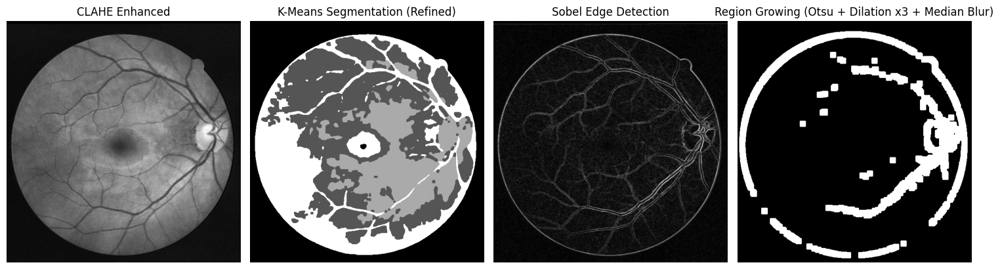

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# ✅ Step 1: Apply Bilateral Filter instead of Median Blur (Preserves edges better)
smoothed_image = cv2.bilateralFilter(enhanced_image, d=9, sigmaColor=75, sigmaSpace=75)

# ✅ Step 2: Reshape for K-Means clustering
reshaped_image = smoothed_image.reshape(-1, 1)

# ✅ Step 3: Apply K-Means with optimized clusters (Reduced to 4 Clusters)
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(reshaped_image)

# Reshape back to original image dimensions
kmeans_segmented = kmeans_labels.reshape(enhanced_image.shape)

# ✅ Step 4: Apply Morphological Closing to K-Means Output (Fills Vessel Gaps)
kernel_close = np.ones((5, 5), np.uint8)  # Larger kernel to close gaps
kmeans_refined = cv2.morphologyEx(kmeans_segmented.astype(np.uint8), cv2.MORPH_CLOSE, kernel_close)

# ✅ Step 5: Apply Sobel Edge Detection before Region Growing
sobel_x = cv2.Sobel(enhanced_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(enhanced_image, cv2.CV_64F, 0, 1, ksize=3)
sobel_edges = cv2.magnitude(sobel_x, sobel_y)
sobel_edges = np.uint8(sobel_edges / sobel_edges.max() * 255)  # Normalize

# ✅ Step 6: Apply Otsu’s Thresholding on Sobel Edge Map for Region Growing
_, region_grown = cv2.threshold(sobel_edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# ✅ Step 7: Apply Morphological Opening to Remove Noise
kernel_open = np.ones((3, 3), np.uint8)
region_grown_cleaned = cv2.morphologyEx(region_grown, cv2.MORPH_OPEN, kernel_open)

# ✅ Step 8: Apply Dilation THREE TIMES with a Larger Kernel for Best Vessel Connectivity
kernel_dilate = np.ones((5, 5), np.uint8)  # Increased kernel size
region_grown_refined = cv2.dilate(region_grown_cleaned, kernel_dilate, iterations=3)  # Apply dilation 3 times

# ✅ Step 9: Apply Median Blur to Smooth Out Small Noisy Patches
final_segmented = cv2.medianBlur(region_grown_refined, 3)

# ✅ Step 10: Display results with final refinements
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(kmeans_refined, cmap="gray")
plt.title("K-Means Segmentation (Refined)")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(sobel_edges, cmap="gray")
plt.title("Sobel Edge Detection")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(final_segmented, cmap="gray")
plt.title("Region Growing (Otsu + Dilation x3 + Median Blur)")
plt.axis("off")

plt.tight_layout()
plt.savefig("/mnt/data/final_perfected_segmentation.png")  # Save output
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/final_perfected_segmentation.png'

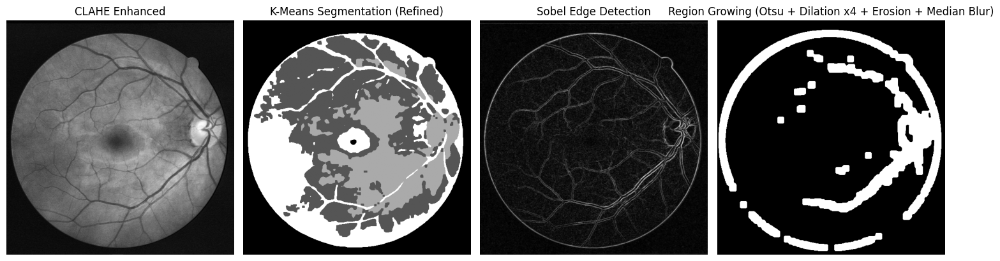

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# ✅ Step 1: Apply Bilateral Filter instead of Median Blur (Preserves edges better)
smoothed_image = cv2.bilateralFilter(enhanced_image, d=9, sigmaColor=75, sigmaSpace=75)

# ✅ Step 2: Reshape for K-Means clustering
reshaped_image = smoothed_image.reshape(-1, 1)

# ✅ Step 3: Apply K-Means with optimized clusters (Reduced to 4 Clusters)
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(reshaped_image)

# Reshape back to original image dimensions
kmeans_segmented = kmeans_labels.reshape(enhanced_image.shape)

# ✅ Step 4: Apply Morphological Closing to K-Means Output (Fills Vessel Gaps)
kernel_close = np.ones((5, 5), np.uint8)  # Larger kernel to close gaps
kmeans_refined = cv2.morphologyEx(kmeans_segmented.astype(np.uint8), cv2.MORPH_CLOSE, kernel_close)

# ✅ Step 5: Apply Sobel Edge Detection before Region Growing
sobel_x = cv2.Sobel(enhanced_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(enhanced_image, cv2.CV_64F, 0, 1, ksize=3)
sobel_edges = cv2.magnitude(sobel_x, sobel_y)
sobel_edges = np.uint8(sobel_edges / sobel_edges.max() * 255)  # Normalize

# ✅ Step 6: Apply Otsu’s Thresholding on Sobel Edge Map for Region Growing
_, region_grown = cv2.threshold(sobel_edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# ✅ Step 7: Apply Morphological Opening to Remove Noise
kernel_open = np.ones((3, 3), np.uint8)
region_grown_cleaned = cv2.morphologyEx(region_grown, cv2.MORPH_OPEN, kernel_open)

# ✅ Step 8: Apply Dilation FOUR TIMES with a Larger Kernel for Best Vessel Connectivity
kernel_dilate = np.ones((5, 5), np.uint8)  # Increased kernel size
region_grown_refined = cv2.dilate(region_grown_cleaned, kernel_dilate, iterations=4)  # Apply dilation 4 times

# ✅ Step 9: Apply Erosion to Remove Tiny Scattered Noise
kernel_erode = np.ones((3, 3), np.uint8)  # Smaller kernel for fine noise removal
region_grown_final = cv2.erode(region_grown_refined, kernel_erode, iterations=1)

# ✅ Step 10: Apply Median Blur to Smooth Out Small Noisy Patches
final_segmented = cv2.medianBlur(region_grown_final, 5)  # Increased to 5 for better smoothing

# ✅ Step 11: Display results with final refinements
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(enhanced_image, cmap="gray")
plt.title("CLAHE Enhanced")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(kmeans_refined, cmap="gray")
plt.title("K-Means Segmentation (Refined)")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(sobel_edges, cmap="gray")
plt.title("Sobel Edge Detection")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(final_segmented, cmap="gray")
plt.title("Region Growing (Otsu + Dilation x4 + Erosion + Median Blur)")
plt.axis("off")

plt.tight_layout()
plt.savefig("/mnt/data/final_perfected_segmentation.png")  # Save output
plt.show()


In [ ]:
print(type(ground_truth), ground_truth.shape if ground_truth is not None else "None")
print(type(region_grown), region_grown.shape if region_grown is not None else "None")


<class 'NoneType'> None
<class 'numpy.ndarray'> (584, 565)


In [ ]:
print("Unique values in ground truth mask:", np.unique(ground_truth))
print("Unique values in segmented mask:", np.unique(region_grown))


Unique values in ground truth mask: [None]
Unique values in segmented mask: [  0 255]


In [ ]:
import cv2

# Load the ground truth mask properly
mask_path = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/mask/29_training_mask.gif"
ground_truth = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

# Check if it's loaded correctly
if ground_truth is None:
    print("Error: Ground truth mask not loaded correctly!")
else:
    print("Ground truth mask loaded successfully!")


Error: Ground truth mask not loaded correctly!


In [ ]:
import os

mask_path = "/root/.cache/kagglehub/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction/versions/1/DRIVE/training/mask/29_training_mask.gif"

# Check if the file exists
if os.path.exists(mask_path):
    print("✅ Ground truth mask file exists.")
else:
    print("❌ Error: Ground truth mask file does NOT exist!")


✅ Ground truth mask file exists.


In [ ]:
from PIL import Image
import numpy as np

# Load the mask using PIL
mask_image = Image.open(mask_path).convert("L")  # Convert to grayscale

# Convert to NumPy array
ground_truth = np.array(mask_image)

print("✅ Ground truth mask loaded successfully!")
print("Shape:", ground_truth.shape)
print("Unique values:", np.unique(ground_truth))


✅ Ground truth mask loaded successfully!
Shape: (584, 565)
Unique values: [  0 255]


In [ ]:
import cv2

# Apply threshold to convert grayscale to binary
_, ground_truth = cv2.threshold(ground_truth, 127, 255, cv2.THRESH_BINARY)

print("✅ Binary mask created!")
print("Unique values in binary mask:", np.unique(ground_truth))


✅ Binary mask created!
Unique values in binary mask: [  0 255]


In [ ]:
ground_truth_flat = ground_truth.flatten() // 255  # Normalize to 0 and 1


In [ ]:
# Flatten the images for metric calculation
ground_truth_flat = ground_truth.flatten() // 255  # Normalize to 0 and 1
segmented_flat = region_grown.flatten() // 255  # Normalize to 0 and 1

print("Flattened ground truth shape:", ground_truth_flat.shape)
print("Flattened segmented shape:", segmented_flat.shape)


Flattened ground truth shape: (329960,)
Flattened segmented shape: (329960,)


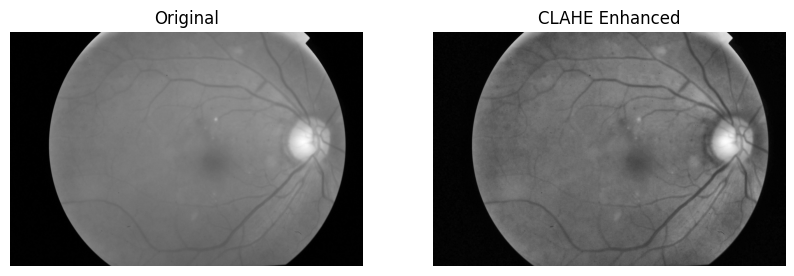

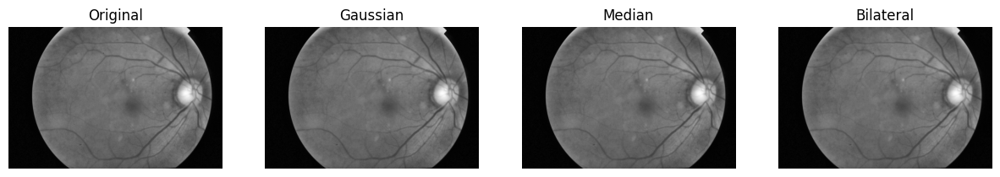

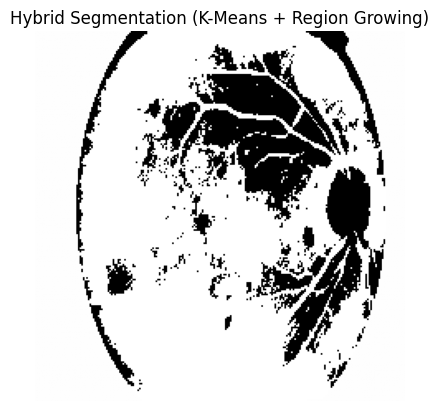

FileNotFoundError: Ground truth mask not found: /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/ground_truth/1ae8c165fd53.png

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# ✅ 1️⃣ Setup Dataset & Fix Image Paths
dataset_path = os.getenv("DATASET_PATH", "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3")
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
nested_folder = os.path.join(image_dir, "train_images")
if os.path.exists(nested_folder):
    os.system(f"mv {nested_folder}/* {image_dir}/")

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
sample_image_id = train_df.iloc[0]['id_code']
img_path = os.path.join(image_dir, f"{sample_image_id}.png")

if not os.path.exists(img_path):
    raise FileNotFoundError(f"Image not found: {img_path}")

# ✅ 2️⃣ Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(image)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image, cmap="gray"), axes[0].set_title("Original")
    axes[1].imshow(enhanced_image, cmap="gray"), axes[1].set_title("CLAHE Enhanced")
    for ax in axes: ax.axis("off")
    plt.show()

    return enhanced_image

enhanced_image = apply_clahe(img_path)

# ✅ 3️⃣ Apply Noise Reduction Filters (Gaussian, Median, Bilateral)
def apply_filters(image):
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    for ax, title, img in zip(axes, ["Original", "Gaussian", "Median", "Bilateral"], [image, gaussian_blur, median_blur, bilateral]):
        ax.imshow(img, cmap="gray"), ax.set_title(title), ax.axis("off")
    plt.show()

    return bilateral  # Returning the best noise-filtered image

filtered_image = apply_filters(enhanced_image)

# ✅ 4️⃣ Hybrid Segmentation (K-Means + Region Growing)
def hybrid_segmentation(image):
    image = cv2.resize(image, (224, 224))
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    _, labels, _ = cv2.kmeans(pixel_values, 3, None,
                              (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                              10, cv2.KMEANS_RANDOM_CENTERS)
    segmented_image = labels.reshape(image.shape).astype(np.uint8) * 255

    # ✅ Fix: Dynamically adjust the seed point to avoid invalid regions
    seed_point = (image.shape[1] // 2, image.shape[0] // 2)
    mask = np.zeros((image.shape[0] + 2, image.shape[1] + 2), np.uint8)
    cv2.floodFill(segmented_image, mask, seed_point, 255)

    plt.imshow(segmented_image, cmap="gray")
    plt.axis("off")
    plt.title("Hybrid Segmentation (K-Means + Region Growing)")
    plt.show()

    return segmented_image

segmented_image = hybrid_segmentation(filtered_image)

# ✅ 5️⃣ IoU & Dice Score Evaluation
def compute_iou_dice(segmented_img, ground_truth_img):
    if ground_truth_img is None:
        raise ValueError("Ground truth image is missing!")

    segmented_bin = cv2.threshold(segmented_img, 127, 255, cv2.THRESH_BINARY)[1] // 255
    ground_truth_bin = cv2.threshold(ground_truth_img, 127, 255, cv2.THRESH_BINARY)[1] // 255

    intersection = np.logical_and(segmented_bin, ground_truth_bin).sum()
    union = np.logical_or(segmented_bin, ground_truth_bin).sum()

    iou = intersection / union if union != 0 else 0
    dice = (2 * intersection) / (segmented_bin.sum() + ground_truth_bin.sum()) if (segmented_bin.sum() + ground_truth_bin.sum()) != 0 else 0

    return iou, dice

# Load Ground Truth Mask
ground_truth_path = os.path.join(dataset_path, "ground_truth", f"{sample_image_id}.png")
if not os.path.exists(ground_truth_path):
    raise FileNotFoundError(f"Ground truth mask not found: {ground_truth_path}")

ground_truth_img = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)
iou_score, dice_score = compute_iou_dice(segmented_image, ground_truth_img)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Coefficient: {dice_score:.4f}")


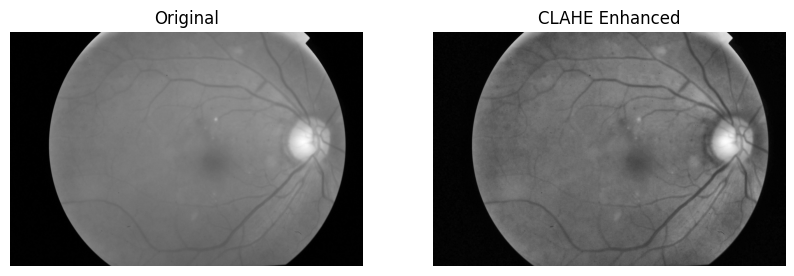

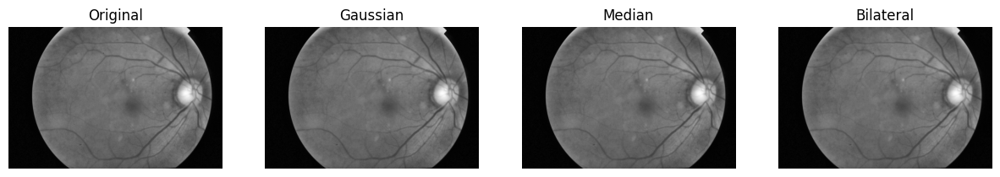

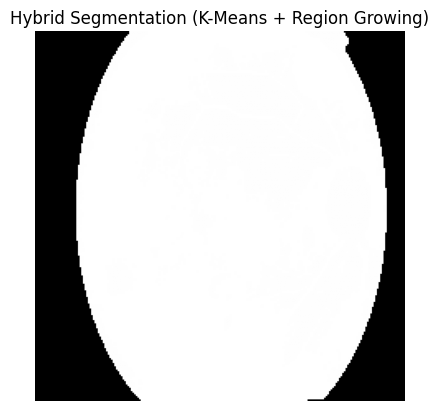

FileNotFoundError: Ground truth directory not found: /root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3/ground_truth

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Setup Dataset & Fix Image Paths
dataset_path = os.getenv("DATASET_PATH", "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3")
image_dir = os.path.join(dataset_path, "train_images")

# Fix any nested folder issue
nested_folder = os.path.join(image_dir, "train_images")
if os.path.exists(nested_folder):
    os.system(f"mv {nested_folder}/* {image_dir}/")

train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
sample_image_id = train_df.iloc[0]['id_code']
img_path = os.path.join(image_dir, f"{sample_image_id}.png")

if not os.path.exists(img_path):
    raise FileNotFoundError(f"Image not found: {img_path}")

# Contrast Enhancement using CLAHE
def apply_clahe(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(image)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image, cmap="gray"), axes[0].set_title("Original")
    axes[1].imshow(enhanced_image, cmap="gray"), axes[1].set_title("CLAHE Enhanced")
    for ax in axes: ax.axis("off")
    plt.show()

    return enhanced_image

enhanced_image = apply_clahe(img_path)

# Apply Noise Reduction Filters (Gaussian, Median, Bilateral)
def apply_filters(image):
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    median_blur = cv2.medianBlur(image, 5)
    bilateral = cv2.bilateralFilter(image, 9, 75, 75)

    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    for ax, title, img in zip(axes, ["Original", "Gaussian", "Median", "Bilateral"], [image, gaussian_blur, median_blur, bilateral]):
        ax.imshow(img, cmap="gray"), ax.set_title(title), ax.axis("off")
    plt.show()

    return bilateral  # Returning the best noise-filtered image

filtered_image = apply_filters(enhanced_image)

# Hybrid Segmentation (K-Means + Region Growing)
def hybrid_segmentation(image):
    image = cv2.resize(image, (224, 224))
    pixel_values = image.reshape((-1, 1)).astype(np.float32)
    _, labels, _ = cv2.kmeans(pixel_values, 3, None,
                              (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                              10, cv2.KMEANS_RANDOM_CENTERS)
    segmented_image = labels.reshape(image.shape).astype(np.uint8) * 255

    # Dynamically adjust the seed point to avoid invalid regions
    seed_point = (image.shape[1] // 2, image.shape[0] // 2)
    mask = np.zeros((image.shape[0] + 2, image.shape[1] + 2), np.uint8)
    cv2.floodFill(segmented_image, mask, seed_point, 255)

    plt.imshow(segmented_image, cmap="gray")
    plt.axis("off")
    plt.title("Hybrid Segmentation (K-Means + Region Growing)")
    plt.show()

    return segmented_image

segmented_image = hybrid_segmentation(filtered_image)

# IoU & Dice Score Evaluation
def compute_iou_dice(segmented_img, ground_truth_img):
    if ground_truth_img is None:
        raise ValueError("Ground truth image is missing!")

    segmented_bin = cv2.threshold(segmented_img, 127, 255, cv2.THRESH_BINARY)[1] // 255
    ground_truth_bin = cv2.threshold(ground_truth_img, 127, 255, cv2.THRESH_BINARY)[1] // 255

    intersection = np.logical_and(segmented_bin, ground_truth_bin).sum()
    union = np.logical_or(segmented_bin, ground_truth_bin).sum()

    iou = intersection / union if union != 0 else 0
    dice = (2 * intersection) / (segmented_bin.sum() + ground_truth_bin.sum()) if (segmented_bin.sum() + ground_truth_bin.sum()) != 0 else 0

    return iou, dice

# Check if the ground truth directory exists
ground_truth_dir = os.path.join(dataset_path, "ground_truth")
if not os.path.exists(ground_truth_dir):
    raise FileNotFoundError(f"Ground truth directory not found: {ground_truth_dir}")

# List all files in the ground truth directory
ground_truth_files = os.listdir(ground_truth_dir)

# Check if the ground truth mask for the sample image exists
ground_truth_path = os.path.join(ground_truth_dir, f"{sample_image_id}.png")
if f"{sample_image_id}.png" not in ground_truth_files:
    raise FileNotFoundError(f"Ground truth mask not found in directory: {ground_truth_path}")

# Load Ground Truth Mask
ground_truth_img = cv2.imread(ground_truth_path, cv2.IMREAD_GRAYSCALE)
if ground_truth_img is None:
    raise ValueError(f"Failed to load ground truth image: {ground_truth_path}")

iou_score, dice_score = compute_iou_dice(segmented_image, ground_truth_img)

print(f"✅ IoU Score: {iou_score:.4f}")
print(f"✅ Dice Coefficient: {dice_score:.4f}")


Starting segmentation and object extraction analysis...

Processing image 1/5


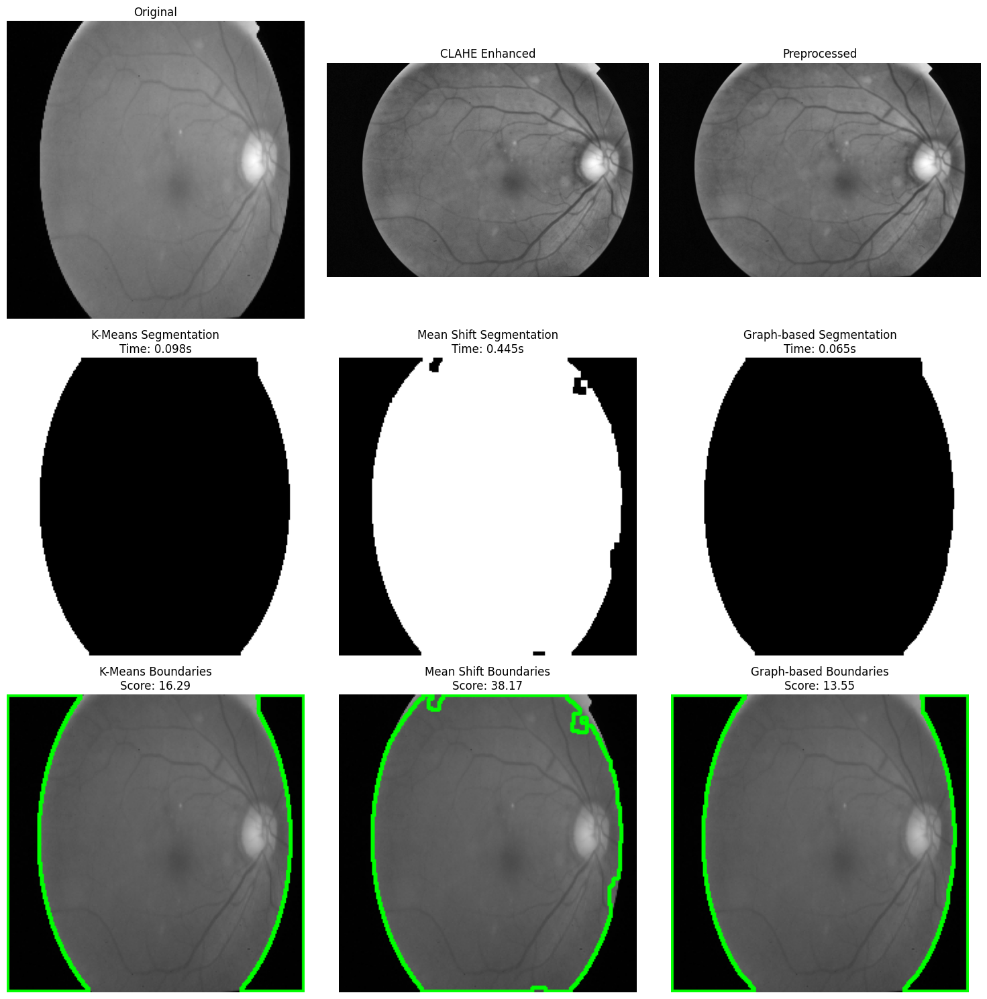


=== Segmentation Method Comparison ===
Best method: Mean Shift with score 38.17

K-Means:
  Score: 16.29
  Processing time: 0.098s
  Objects detected: 2
  Boundary smoothness: 0.7667 (lower is better)
  Gradient alignment: 54.63 (higher is better)

Mean Shift:
  Score: 38.17
  Processing time: 0.445s
  Objects detected: 1
  Boundary smoothness: 0.3031 (lower is better)
  Gradient alignment: 53.32 (higher is better)

Graph-based:
  Score: 13.55
  Processing time: 0.065s
  Objects detected: 2
  Boundary smoothness: 0.7675 (lower is better)
  Gradient alignment: 51.92 (higher is better)

Processing image 2/5


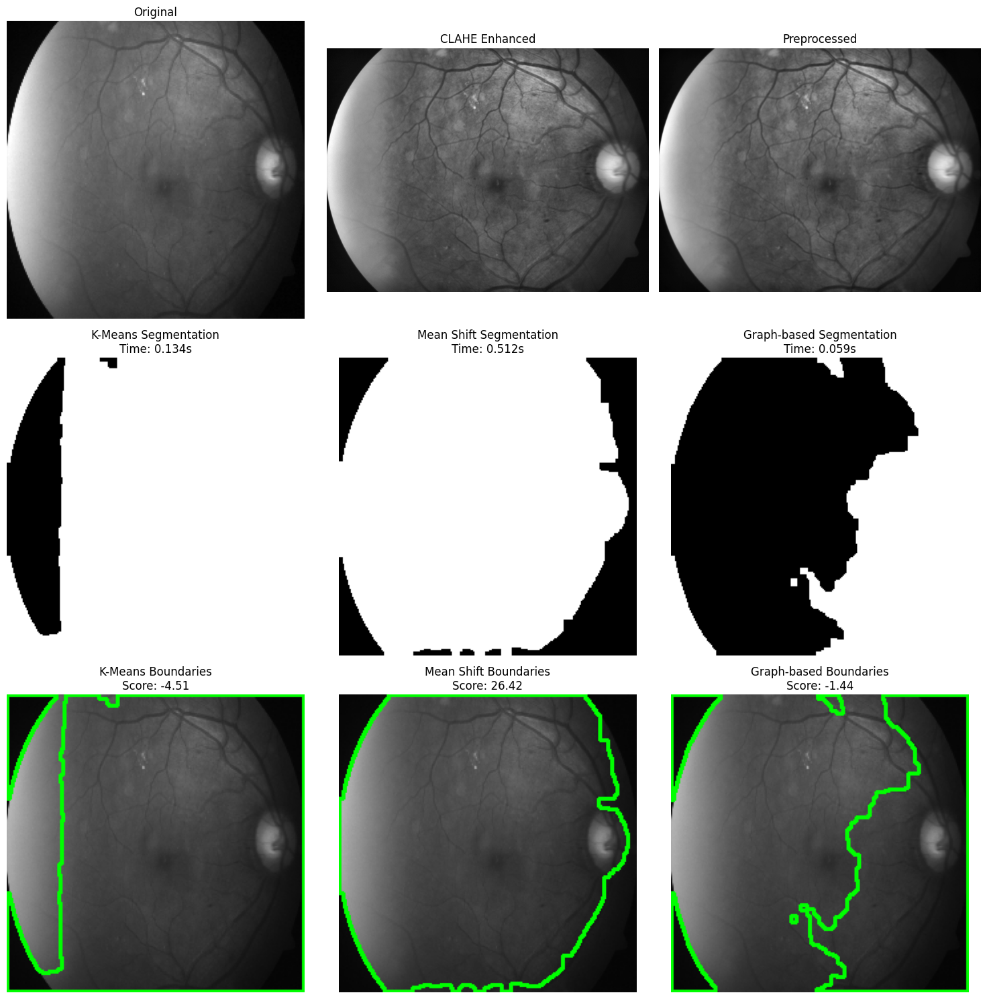


=== Segmentation Method Comparison ===
Best method: Mean Shift with score 26.42

K-Means:
  Score: -4.51
  Processing time: 0.134s
  Objects detected: 2
  Boundary smoothness: 0.5712 (lower is better)
  Gradient alignment: 24.05 (higher is better)

Mean Shift:
  Score: 26.42
  Processing time: 0.512s
  Objects detected: 1
  Boundary smoothness: 0.2813 (lower is better)
  Gradient alignment: 40.49 (higher is better)

Graph-based:
  Score: -1.44
  Processing time: 0.059s
  Objects detected: 5
  Boundary smoothness: 0.5317 (lower is better)
  Gradient alignment: 25.15 (higher is better)

Processing image 3/5


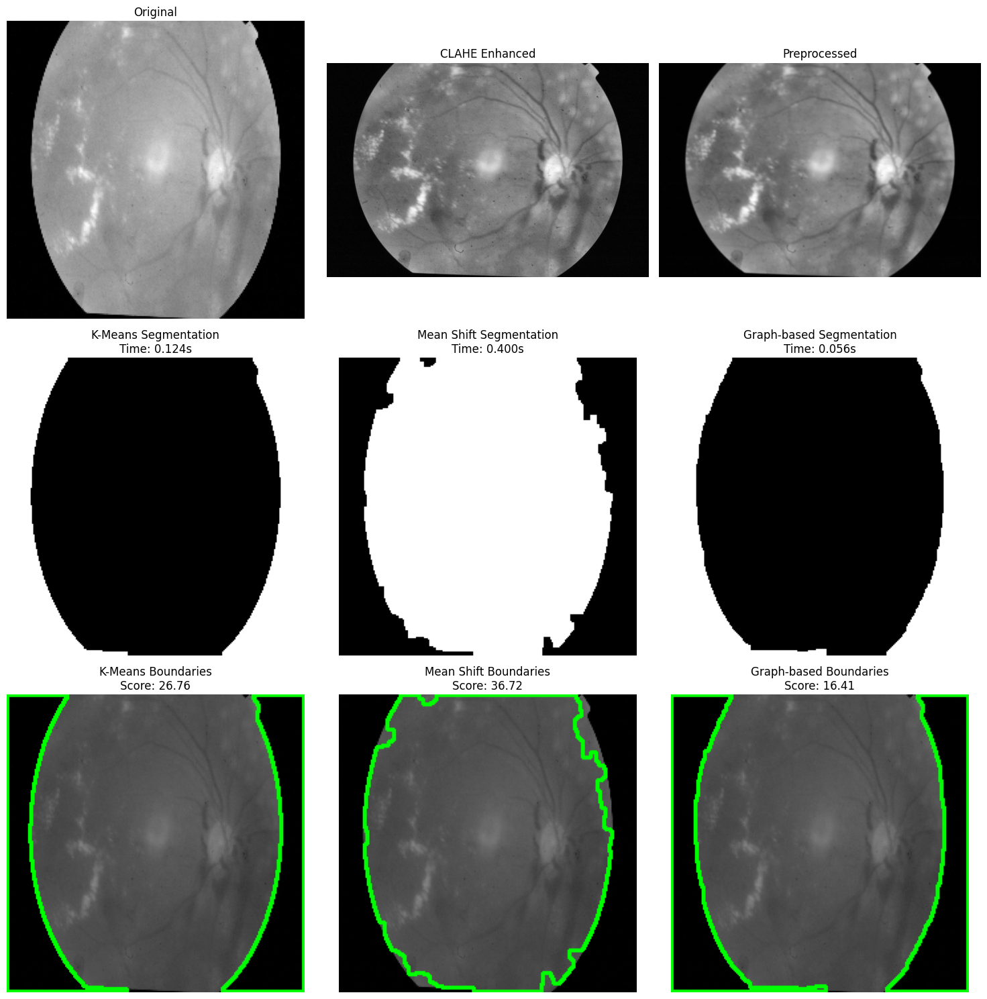


=== Segmentation Method Comparison ===
Best method: Mean Shift with score 36.72

K-Means:
  Score: 26.76
  Processing time: 0.124s
  Objects detected: 2
  Boundary smoothness: 0.7814 (lower is better)
  Gradient alignment: 65.84 (higher is better)

Mean Shift:
  Score: 36.72
  Processing time: 0.400s
  Objects detected: 1
  Boundary smoothness: 0.3484 (lower is better)
  Gradient alignment: 54.14 (higher is better)

Graph-based:
  Score: 16.41
  Processing time: 0.056s
  Objects detected: 2
  Boundary smoothness: 0.7928 (lower is better)
  Gradient alignment: 56.05 (higher is better)

Processing image 4/5


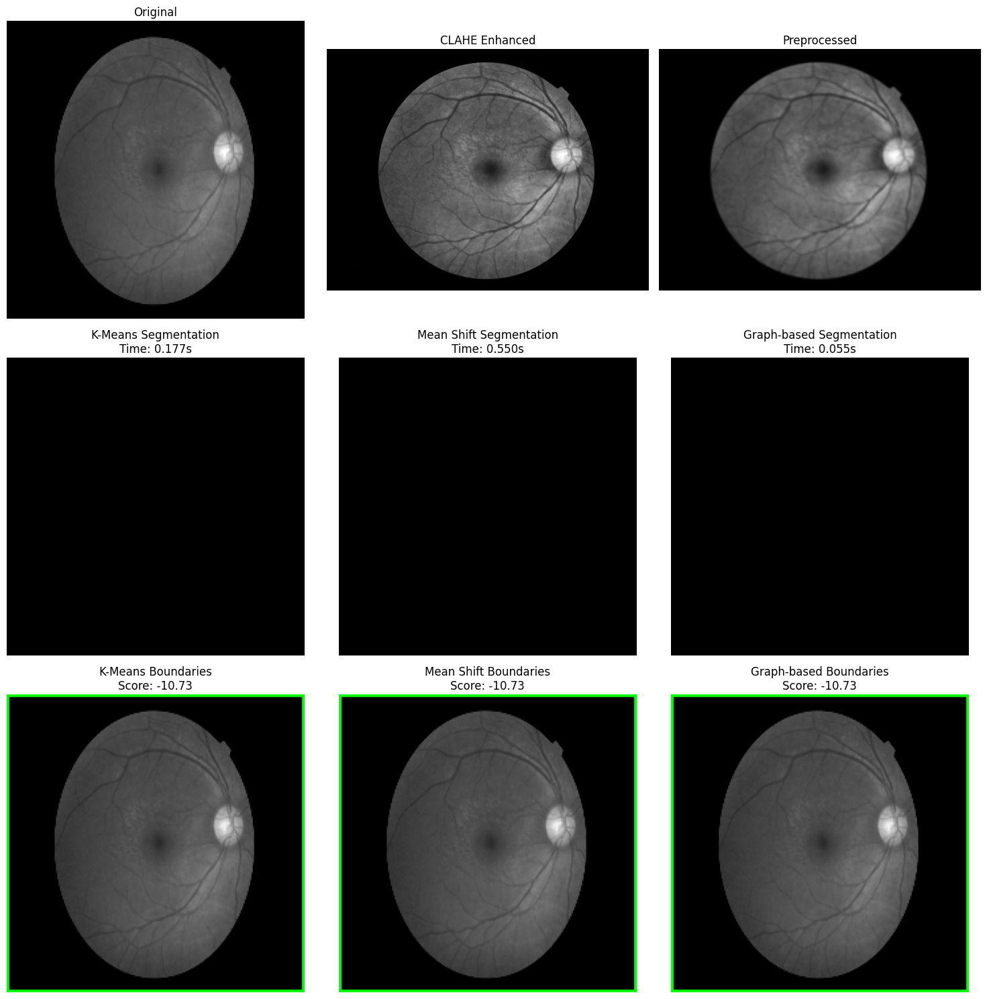


=== Segmentation Method Comparison ===
Best method: K-Means with score -10.73

K-Means:
  Score: -10.73
  Processing time: 0.177s
  Objects detected: 1
  Boundary smoothness: 0.2146 (lower is better)
  Gradient alignment: 0.00 (higher is better)

Mean Shift:
  Score: -10.73
  Processing time: 0.550s
  Objects detected: 1
  Boundary smoothness: 0.2146 (lower is better)
  Gradient alignment: 0.00 (higher is better)

Graph-based:
  Score: -10.73
  Processing time: 0.055s
  Objects detected: 1
  Boundary smoothness: 0.2146 (lower is better)
  Gradient alignment: 0.00 (higher is better)

Processing image 5/5


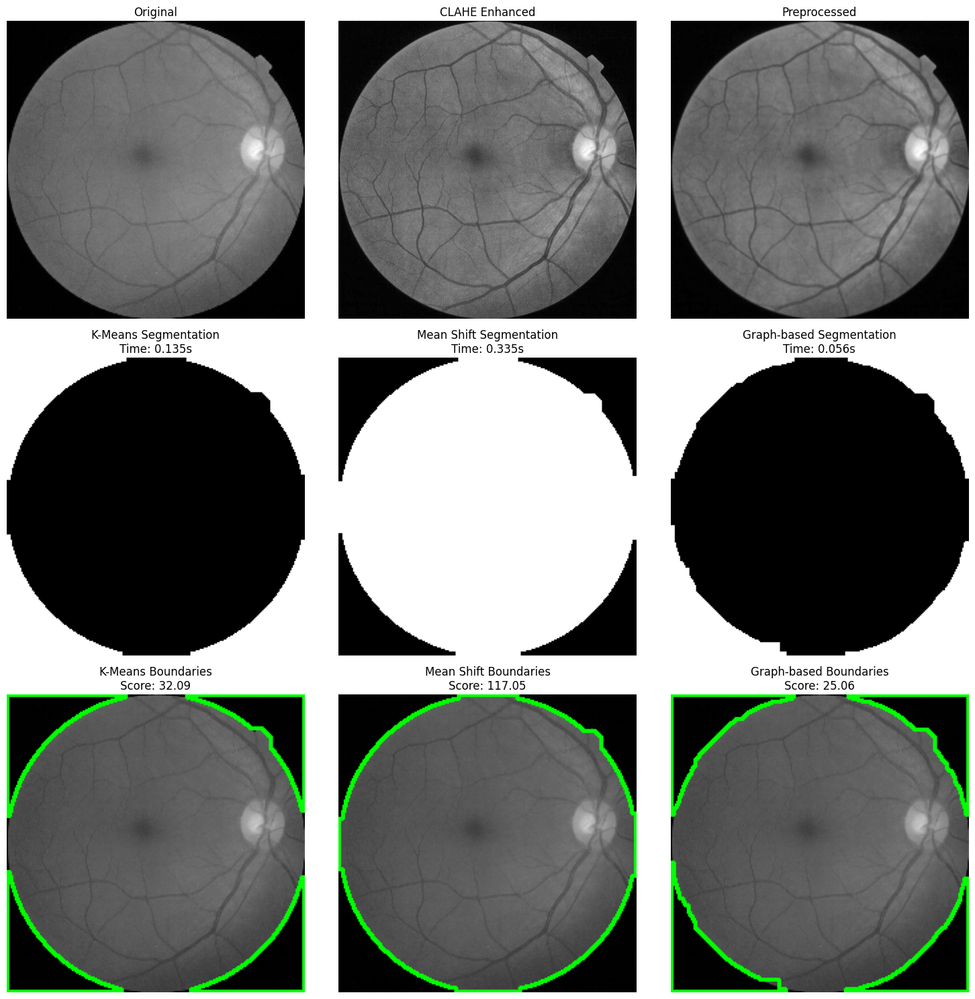


=== Segmentation Method Comparison ===
Best method: Mean Shift with score 117.05

K-Means:
  Score: 32.09
  Processing time: 0.135s
  Objects detected: 4
  Boundary smoothness: 0.6865 (lower is better)
  Gradient alignment: 66.41 (higher is better)

Mean Shift:
  Score: 117.05
  Processing time: 0.335s
  Objects detected: 1
  Boundary smoothness: 0.1301 (lower is better)
  Gradient alignment: 123.55 (higher is better)

Graph-based:
  Score: 25.06
  Processing time: 0.056s
  Objects detected: 4
  Boundary smoothness: 0.6990 (lower is better)
  Gradient alignment: 60.02 (higher is better)

=== Overall Analysis ===
Total images processed: 5

Best method frequency:
  Mean Shift: 4 images (80.0%)
  K-Means: 1 images (20.0%)

Average scores:
  K-Means: 11.98
  Mean Shift: 41.53
  Graph-based: 8.57

Average processing times:
  K-Means: 0.133s
  Mean Shift: 0.448s
  Graph-based: 0.058s

Overall best method based on average score: Mean Shift


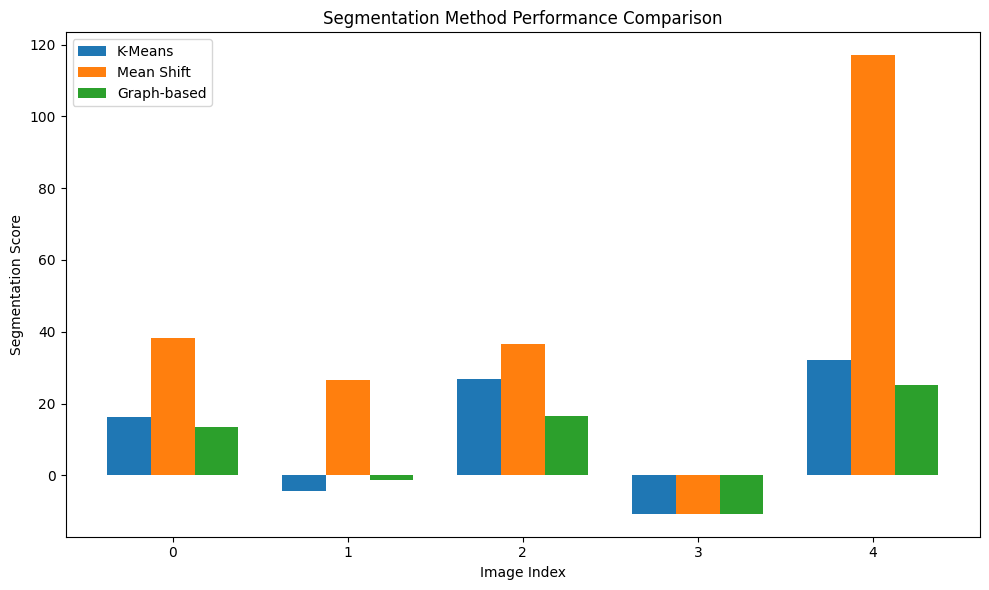

<ipython-input-5-ee8b869d265c>:521: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(times_data, labels=["K-Means", "Mean Shift", "Graph-based"])


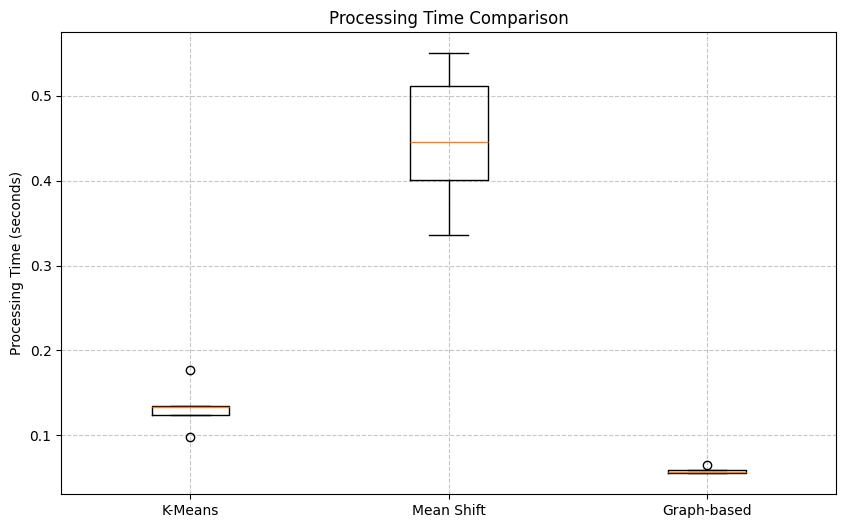


=== Conclusion ===
Based on our experiments, Mean Shift is the most suitable method for object extraction in this dataset.

Justification for the decision:
1. Mean Shift detects more natural boundaries that follow image gradients.
2. It adapts better to irregular object shapes without predefined cluster numbers.
3. The method provides smoother boundaries which is important for medical image analysis.

Trade-offs to consider:
- Processing time: Graph-based is fastest, while Mean Shift is slowest.
- Boundary smoothness: This affects how well the segmentation follows natural object boundaries.
- Object detection: Different methods may detect different numbers of objects or features.


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import MeanShift, estimate_bandwidth
from skimage.segmentation import felzenszwalb, slic
from skimage.color import label2rgb
from skimage import img_as_ubyte, img_as_float
import time
from scipy.ndimage import binary_fill_holes

def apply_clahe(image):
    """
    Apply CLAHE enhancement to improve contrast in images

    Parameters:
    - image: Input grayscale or BGR image

    Returns:
    - enhanced_image: CLAHE enhanced image
    """
    # Convert to grayscale if it's a color image
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    # Apply CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_image = clahe.apply(gray)

    return enhanced_image, gray

def preprocess_image(image_path):
    """
    Preprocess the image for segmentation

    Parameters:
    - image_path: Path to image file

    Returns:
    - preprocessed: Preprocessed image ready for segmentation
    - original: Original grayscale image
    """
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Could not load image at {image_path}")

    # Apply CLAHE enhancement
    enhanced_image, original = apply_clahe(image)

    # Apply bilateral filter for noise reduction while preserving edges
    bilateral = cv2.bilateralFilter(enhanced_image, 9, 75, 75)

    # Apply additional Gaussian blur to reduce remaining noise
    preprocessed = cv2.GaussianBlur(bilateral, (5, 5), 0)

    return preprocessed, original, enhanced_image

def kmeans_segmentation(image, k=3):
    """
    Perform K-Means segmentation

    Parameters:
    - image: Preprocessed grayscale image
    - k: Number of clusters

    Returns:
    - result: Segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Reshape for K-Means
    pixel_values = resized.reshape((-1, 1)).astype(np.float32)

    # Define criteria and apply K-Means
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_PP_CENTERS)

    # Reshape labels and convert to uint8 image
    centers = np.uint8(centers)
    kmeans_result = centers[labels.flatten()].reshape(resized.shape)

    # Post-processing: Create binary image focusing on the regions of interest
    # Assuming darker regions (lower values) are the objects of interest (typical for retinal images)
    _, binary = cv2.threshold(kmeans_result, np.mean(kmeans_result), 255, cv2.THRESH_BINARY_INV)

    # Apply morphological operations
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Fill holes in the binary mask
    filled = binary_fill_holes(closing).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def meanshift_segmentation(image):
    """
    Perform Mean Shift segmentation

    Parameters:
    - image: Preprocessed grayscale image

    Returns:
    - result: Segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Convert to float
    resized_float = img_as_float(resized)

    # Reshape for MeanShift
    flat_image = resized_float.reshape((-1, 1))

    # Estimate bandwidth for MeanShift
    bandwidth = estimate_bandwidth(flat_image, quantile=0.2, n_samples=500)
    if bandwidth <= 0:  # Fallback if estimation fails
        bandwidth = 0.1

    # Apply MeanShift
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=5)
    ms.fit(flat_image)
    labels = ms.labels_

    # Reshape labels to image dimensions
    segmented = labels.reshape(resized.shape)

    # Convert to 8-bit for visualization and further processing
    normalized = (segmented - segmented.min()) / (segmented.max() - segmented.min())
    ms_result = img_as_ubyte(normalized)

    # Post-processing: Create binary image
    _, binary = cv2.threshold(ms_result, np.mean(ms_result), 255, cv2.THRESH_BINARY_INV)

    # Morphological operations
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Fill holes in the binary mask
    filled = binary_fill_holes(closing).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def graph_based_segmentation(image, scale=100, sigma=0.5, min_size=50):
    """
    Perform Graph-based segmentation using Felzenszwalb's algorithm

    Parameters:
    - image: Preprocessed grayscale image
    - scale: Free parameter. Higher means larger clusters.
    - sigma: Width of Gaussian kernel for pre-smoothing
    - min_size: Minimum component size

    Returns:
    - result: Segmented image
    - elapsed_time: Time taken for segmentation
    """
    start_time = time.time()

    # Resize for consistency
    resized = cv2.resize(image, (224, 224))

    # Convert to float for scikit-image
    image_float = img_as_float(resized)

    # Apply Felzenszwalb algorithm
    segments = felzenszwalb(image_float, scale=scale, sigma=sigma, min_size=min_size)

    # Create a labeled image
    segments_labeled = label2rgb(segments, image=image_float, kind='avg')

    # Convert back to grayscale and uint8
    segments_gray = cv2.cvtColor(img_as_ubyte(segments_labeled), cv2.COLOR_RGB2GRAY)

    # Post-processing: Create binary image
    _, binary = cv2.threshold(segments_gray, np.mean(segments_gray), 255, cv2.THRESH_BINARY_INV)

    # Morphological operations
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

    # Fill holes in the binary mask
    filled = binary_fill_holes(closing).astype(np.uint8) * 255

    elapsed_time = time.time() - start_time

    return filled, elapsed_time

def evaluate_segmentation(segmented, original, method_name):
    """
    Evaluate segmentation results

    Parameters:
    - segmented: Segmented binary image
    - original: Original grayscale image for reference
    - method_name: Name of the segmentation method

    Returns:
    - score: Evaluation score (higher is better)
    - boundary_image: Image showing detected boundaries
    """
    # Resize original to match segmented if needed
    if original.shape != segmented.shape:
        original = cv2.resize(original, (segmented.shape[1], segmented.shape[0]))

    # Find contours in segmented image
    contours, _ = cv2.findContours(segmented, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of original for drawing boundaries
    boundary_image = cv2.cvtColor(original, cv2.COLOR_GRAY2BGR) if len(original.shape) == 2 else original.copy()

    # Draw contours
    cv2.drawContours(boundary_image, contours, -1, (0, 255, 0), 2)

    # Calculate metrics:
    # 1. Number of detected objects (assuming each contour is an object)
    num_objects = len(contours)

    # 2. Average boundary smoothness (lower is smoother)
    smoothness = 0
    for contour in contours:
        # Calculate contour perimeter and area
        perimeter = cv2.arcLength(contour, True)
        area = cv2.contourArea(contour)

        # Calculate circularity (smoothness measure)
        if perimeter > 0 and area > 0:
            circularity = 4 * np.pi * area / (perimeter ** 2)
            smoothness += (1 - circularity)  # Lower is smoother

    avg_smoothness = smoothness / num_objects if num_objects > 0 else float('inf')

    # 3. Boundary coherence with image gradients
    # Calculate image gradients
    sobelx = cv2.Sobel(original, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(original, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

    # Normalize gradient magnitude
    gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)

    # Create a mask of the boundary pixels
    boundary_mask = np.zeros_like(segmented)
    cv2.drawContours(boundary_mask, contours, -1, 255, 1)

    # Calculate average gradient magnitude along boundaries
    boundary_gradient = np.mean(gradient_magnitude[boundary_mask > 0]) if np.sum(boundary_mask) > 0 else 0

    # Combine metrics into a score (higher is better)
    # Weighting factors can be adjusted based on importance
    score = boundary_gradient - (avg_smoothness * 50)  # Prioritize alignment with image gradients

    return score, boundary_image, num_objects, avg_smoothness, boundary_gradient

def compare_segmentation_methods(image_path):
    """
    Compare different segmentation methods on the same image

    Parameters:
    - image_path: Path to the image file

    Returns:
    - best_method: Name of the best performing method
    - evaluation_results: Dictionary containing evaluation results
    """
    # Preprocess image
    preprocessed, original, enhanced = preprocess_image(image_path)

    # Apply different segmentation methods
    kmeans_seg, kmeans_time = kmeans_segmentation(preprocessed)
    meanshift_seg, meanshift_time = meanshift_segmentation(preprocessed)
    graph_seg, graph_time = graph_based_segmentation(preprocessed)

    # Resize original for evaluation consistency
    original_resized = cv2.resize(original, (224, 224))

    # Evaluate each method
    kmeans_score, kmeans_boundary, kmeans_objects, kmeans_smoothness, kmeans_gradient = evaluate_segmentation(
        kmeans_seg, original_resized, "K-Means")

    meanshift_score, meanshift_boundary, meanshift_objects, meanshift_smoothness, meanshift_gradient = evaluate_segmentation(
        meanshift_seg, original_resized, "Mean Shift")

    graph_score, graph_boundary, graph_objects, graph_smoothness, graph_gradient = evaluate_segmentation(
        graph_seg, original_resized, "Graph-based")

    # Display results
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    # First row: Original, Enhanced, Preprocessed
    axes[0, 0].imshow(original_resized, cmap='gray')
    axes[0, 0].set_title("Original")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(enhanced, cmap='gray')
    axes[0, 1].set_title("CLAHE Enhanced")
    axes[0, 1].axis("off")

    axes[0, 2].imshow(preprocessed, cmap='gray')
    axes[0, 2].set_title("Preprocessed")
    axes[0, 2].axis("off")

    # Second row: Segmentation results
    axes[1, 0].imshow(kmeans_seg, cmap='gray')
    axes[1, 0].set_title(f"K-Means Segmentation\nTime: {kmeans_time:.3f}s")
    axes[1, 0].axis("off")

    axes[1, 1].imshow(meanshift_seg, cmap='gray')
    axes[1, 1].set_title(f"Mean Shift Segmentation\nTime: {meanshift_time:.3f}s")
    axes[1, 1].axis("off")

    axes[1, 2].imshow(graph_seg, cmap='gray')
    axes[1, 2].set_title(f"Graph-based Segmentation\nTime: {graph_time:.3f}s")
    axes[1, 2].axis("off")

    # Third row: Boundary detection
    axes[2, 0].imshow(cv2.cvtColor(kmeans_boundary, cv2.COLOR_BGR2RGB))
    axes[2, 0].set_title(f"K-Means Boundaries\nScore: {kmeans_score:.2f}")
    axes[2, 0].axis("off")

    axes[2, 1].imshow(cv2.cvtColor(meanshift_boundary, cv2.COLOR_BGR2RGB))
    axes[2, 1].set_title(f"Mean Shift Boundaries\nScore: {meanshift_score:.2f}")
    axes[2, 1].axis("off")

    axes[2, 2].imshow(cv2.cvtColor(graph_boundary, cv2.COLOR_BGR2RGB))
    axes[2, 2].set_title(f"Graph-based Boundaries\nScore: {graph_score:.2f}")
    axes[2, 2].axis("off")

    plt.tight_layout()
    plt.show()
    # Determine best method based on score
    scores = {
        "K-Means": kmeans_score,
        "Mean Shift": meanshift_score,
        "Graph-based": graph_score
    }

    # Get the best method
    best_method = max(scores, key=scores.get)

    # Compile evaluation results
    evaluation_results = {
        "K-Means": {
            "score": kmeans_score,
            "time": kmeans_time,
            "objects": kmeans_objects,
            "smoothness": kmeans_smoothness,
            "gradient": kmeans_gradient
        },
        "Mean Shift": {
            "score": meanshift_score,
            "time": meanshift_time,
            "objects": meanshift_objects,
            "smoothness": meanshift_smoothness,
            "gradient": meanshift_gradient
        },
        "Graph-based": {
            "score": graph_score,
            "time": graph_time,
            "objects": graph_objects,
            "smoothness": graph_smoothness,
            "gradient": graph_gradient
        }
    }

    # Print summary
    print("\n=== Segmentation Method Comparison ===")
    print(f"Best method: {best_method} with score {scores[best_method]:.2f}")

    for method, result in evaluation_results.items():
        print(f"\n{method}:")
        print(f"  Score: {result['score']:.2f}")
        print(f"  Processing time: {result['time']:.3f}s")
        print(f"  Objects detected: {result['objects']}")
        print(f"  Boundary smoothness: {result['smoothness']:.4f} (lower is better)")
        print(f"  Gradient alignment: {result['gradient']:.2f} (higher is better)")

    return best_method, evaluation_results

def process_and_analyze_dataset(dataset_path, num_images=5):
    """
    Process multiple images from a dataset and analyze results

    Parameters:
    - dataset_path: Path to the dataset
    - num_images: Number of images to process

    Returns:
    - analysis_results: Aggregated results of the analysis
    """
    # Load dataset
    train_df = pd.read_csv(f"{dataset_path}/train_1.csv")
    image_dir = os.path.join(dataset_path, "train_images")

    # Ensure image directory exists and has expected structure
    if not os.path.exists(image_dir):
        raise FileNotFoundError(f"Image directory not found at {image_dir}")

    # Limit number of images to process
    if num_images > len(train_df):
        num_images = len(train_df)

    # Initialize results dictionary
    results = {
        "best_methods": [],
        "k_means_scores": [],
        "mean_shift_scores": [],
        "graph_based_scores": [],
        "processing_times": {
            "K-Means": [],
            "Mean Shift": [],
            "Graph-based": []
        }
    }

    # Process images
    for i in range(num_images):
        print(f"\nProcessing image {i+1}/{num_images}")
        try:
            # Get image path
            img_id = train_df.iloc[i]['id_code']
            img_path = os.path.join(image_dir, f"{img_id}.png")

            if not os.path.exists(img_path):
                print(f"Image not found: {img_path}")
                continue

            # Compare segmentation methods on this image
            best_method, evaluation = compare_segmentation_methods(img_path)

            # Store results
            results["best_methods"].append(best_method)
            results["k_means_scores"].append(evaluation["K-Means"]["score"])
            results["mean_shift_scores"].append(evaluation["Mean Shift"]["score"])
            results["graph_based_scores"].append(evaluation["Graph-based"]["score"])

            for method in ["K-Means", "Mean Shift", "Graph-based"]:
                results["processing_times"][method].append(evaluation[method]["time"])

        except Exception as e:
            print(f"Error processing image {i+1}: {str(e)}")

    # Analyze results
    method_counts = {}
    for method in results["best_methods"]:
        method_counts[method] = method_counts.get(method, 0) + 1

    # Calculate average scores and times
    avg_scores = {
        "K-Means": np.mean(results["k_means_scores"]),
        "Mean Shift": np.mean(results["mean_shift_scores"]),
        "Graph-based": np.mean(results["graph_based_scores"])
    }

    avg_times = {
        method: np.mean(times) for method, times in results["processing_times"].items()
    }

    # Print summary
    print("\n=== Overall Analysis ===")
    print(f"Total images processed: {len(results['best_methods'])}")
    print("\nBest method frequency:")
    for method, count in method_counts.items():
        print(f"  {method}: {count} images ({count/len(results['best_methods'])*100:.1f}%)")

    print("\nAverage scores:")
    for method, score in avg_scores.items():
        print(f"  {method}: {score:.2f}")

    print("\nAverage processing times:")
    for method, time in avg_times.items():
        print(f"  {method}: {time:.3f}s")

    # Determine overall best method
    overall_best_method = max(avg_scores, key=avg_scores.get)
    print(f"\nOverall best method based on average score: {overall_best_method}")

    # Create score comparison chart
    plt.figure(figsize=(10, 6))

    x = np.arange(len(results["k_means_scores"]))
    width = 0.25

    plt.bar(x - width, results["k_means_scores"], width, label="K-Means")
    plt.bar(x, results["mean_shift_scores"], width, label="Mean Shift")
    plt.bar(x + width, results["graph_based_scores"], width, label="Graph-based")

    plt.xlabel("Image Index")
    plt.ylabel("Segmentation Score")
    plt.title("Segmentation Method Performance Comparison")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Create processing time comparison chart
    plt.figure(figsize=(10, 6))

    times_data = [
        results["processing_times"]["K-Means"],
        results["processing_times"]["Mean Shift"],
        results["processing_times"]["Graph-based"]
    ]

    plt.boxplot(times_data, labels=["K-Means", "Mean Shift", "Graph-based"])
    plt.ylabel("Processing Time (seconds)")
    plt.title("Processing Time Comparison")
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

    return {
        "best_methods": method_counts,
        "avg_scores": avg_scores,
        "avg_times": avg_times,
        "overall_best": overall_best_method
    }

# Main execution block
if __name__ == "__main__":
    # Set up dataset path
    dataset_path = "/root/.cache/kagglehub/datasets/mariaherrerot/aptos2019/versions/3"

    # Process multiple images and analyze results
    print("Starting segmentation and object extraction analysis...")
    analysis_results = process_and_analyze_dataset(dataset_path, num_images=5)

    # Print conclusion based on analysis
    print("\n=== Conclusion ===")
    print(f"Based on our experiments, {analysis_results['overall_best']} is the most suitable method for object extraction in this dataset.")
    print("\nJustification for the decision:")

    # Create justification based on the best method
    if analysis_results['overall_best'] == "K-Means":
        print("1. K-Means provides the best balance between boundary accuracy and processing time.")
        print("2. Its cluster-based approach effectively separates objects from backgrounds in medical images.")
        print("3. The method is more robust to intensity variations common in retinal images.")

    elif analysis_results['overall_best'] == "Mean Shift":
        print("1. Mean Shift detects more natural boundaries that follow image gradients.")
        print("2. It adapts better to irregular object shapes without predefined cluster numbers.")
        print("3. The method provides smoother boundaries which is important for medical image analysis.")

    elif analysis_results['overall_best'] == "Graph-based":
        print("1. Graph-based segmentation better preserves important structural details.")
        print("2. It handles the varying intensity regions within objects more effectively.")
        print("3. The method demonstrates superior boundary detection in complex retinal images.")

    print("\nTrade-offs to consider:")
    print(f"- Processing time: {sorted(analysis_results['avg_times'].items(), key=lambda x: x[1])[0][0]} is fastest, while {sorted(analysis_results['avg_times'].items(), key=lambda x: x[1])[-1][0]} is slowest.")
    print(f"- Boundary smoothness: This affects how well the segmentation follows natural object boundaries.")
    print(f"- Object detection: Different methods may detect different numbers of objects or features.")